# EE782 : Advanced Topics in Machine Learning

## Deep Recurrent Q-Learning For Partially Observable Markov Decision Processes

### Collaborators

- Rohan Rajesh Kalbag
- Sankalp Bhamare
- Vansh Kapoor

## Dependencies

In [ ]:
!pip install swig
!pip install gymnasium[atari]
!pip install gymnasium[accept-rom-license]
!pip install matplotlib

In [ ]:
import torch
import torch.nn as nn
import numpy as np
from matplotlib import animation
import matplotlib.pyplot as plt
import gymnasium as gym
import random
import copy

SIZE = (210, 160, 3) # Atari 2600 screen size (state space size)
WINDOW_SIZE = 3 # Number of frames to stack together as input to the network

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') # Use GPU if available
print(device)

# Using Deep Recurrent Q-Learning for Atari Assault-v5 Game

## Setting up the DRQN

### Deep Memory Class

In [ ]:
class DeepMemory:
    def __init__(self, MAX_LENGTH=5000):
        # Memory is a dictionary of lists of tuples
        self.memory = {}
        self.MAX_LENGTH = MAX_LENGTH

    def remember(self, state, next_state, action, reward, done):
        # If reward is not in memory, add it
        if reward not in self.memory:
            self.memory[reward] = []

        # Add the new experience to the memory
        self.memory[reward].append((state, next_state, action, reward, done))

        # If the memory is full, remove the oldest experience
        if len(self.memory[reward]) > self.MAX_LENGTH:
            self.memory[reward].pop(0)

    def sample(self, batch_size):
        # Randomly sample from the memory
        batch = []
        for i in range(batch_size):
            reward = np.random.choice(list(self.memory.keys()))
            batch.append(random.choice(self.memory[reward]))
        return batch

    def render_sample(self, sample):
        # Render a sample from the memory
        for el in sample:
            state, next_state, action, reward, done = el
            print("--------------------------------------------------")
            plt.title("Curr State")
            plt.imshow(np.hstack(state))
            plt.axis('off')
            plt.show()

            plt.title("Next State")
            plt.imshow(np.hstack(next_state))
            plt.axis('off')
            plt.show()

            print("Action: ", action)
            print("Reward: ", reward)
            print("Done: ", done)
            print("--------------------------------------------------")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Agent Class

In [ ]:
import torchvision.transforms as transforms

class Agent:
    def __init__(self, model, feature_extractor, epsMem, batchsize=64, ep_window_size=3, l_rate=0.001, epsilon_decay=0.9999):
        self.model = model # LSTM based Q Network
        self.feature_extractor = feature_extractor # ResNet18 based Transfer Learned Feature Extractor
        self.target_model = copy.deepcopy(model) # Target Network for Double DQN based learning
        self.deepMem = DeepMemory()
        self.epsMem = epsMem
        self.batchsize = batchsize
        self.ep_window_size = ep_window_size
        self.epsilon = 1.0
        self.gamma = 0.9
        # optimizer for both feature extractor and model
        self.optimizer = torch.optim.Adagrad(list(self.model.parameters()) + list(self.feature_extractor.parameters()), lr=l_rate)
        self.train_count = 0
        self.epsilon_decay = epsilon_decay


    def generate_windows(self, x, win):
        # Optimized function to generate windowed episodic memory
        y = torch.zeros(x.shape[0], win, *x.shape[1:])
        y  = torch.stack([ x[i - win + 1 : i + 1]  for i in range(WINDOW_SIZE-1, x.shape[0]) ])
        return y


    def parse_state(self, state):
        # Normalize the input frames
        normalize = transforms.Normalize(mean=[-0.445 / 0.225] * 3, std=[1 / 0.225] * 3)
        preprocess = transforms.Compose([
            transforms.ToPILImage(),
            transforms.ToTensor(),
            normalize
        ])

        # Convert the input frames to tensors
        torch_images = [preprocess(img) for img in state]
        torch_images = torch.stack(torch_images)
        return torch_images

    def make_states(self, raw_states):
        states = self.parse_state(raw_states)
        states = states.to(device)
        features = self.feature_extractor(states)

        # Generate windowed episodic memory
        result = self.generate_windows(features, WINDOW_SIZE)
        return result

    def predict(self, state):
        state = self.make_states(state)
        pred = self.model(state) # predict the Q values for the current state
        # randomly take an action with epsilon probability
        if random.random() < self.epsilon:
            return random.randint(0, 6)
        else:
            # take the action predicted by the Deep Q network
            return torch.argmax(pred[0]).item()

    def train(self):
        eps_batch = self.epsMem.sample(self.ep_window_size) # sample a batch from the episodic memory
        loss_acc = 0.0
        for i in range(0, len(eps_batch), self.batchsize):
            # generate the states, next_states, actions, rewards and dones for the batch
            raw_batch = eps_batch[(max(i-WINDOW_SIZE+1,0)):(i+self.batchsize)]
            states = [x[0] for x in raw_batch]
            next_states = [x[1] for x in raw_batch]
            if i == 0:
                # if the batch is the first batch, pad the states and next_states with blank frames
                null_paddings = [np.zeros(SIZE, dtype=np.uint8) for i in range(WINDOW_SIZE-1)]
                states = null_paddings + states
                next_states = null_paddings[:-1] + [states[0]] + next_states
            else:
                # if the batch is not the first batch, pad the states and next_states with the last few frames from the previous batch
                start_batch = eps_batch[(i-WINDOW_SIZE+1):i]
                states_padding = [x[0] for x in start_batch]
                next_states_padding = [x[1] for x in start_batch]
                states = states_padding + states
                next_states = next_states_padding + next_states

            actions = [int(x[2]) for x in raw_batch]
            rewards = [float(x[3]) for x in raw_batch]
            dones = [float(int(x[4])) for x in raw_batch]

            loss_acc += self.train_batch(states, next_states, actions, rewards, dones)
        return loss_acc


    def train_batch(self, states, next_states, actions, rewards, dones):
        # Train the model using the batch
        self.feature_extractor.train()
        self.feature_extractor.zero_grad()
        states = self.make_states(states)
        next_states = self.make_states(next_states)
        future_reward = torch.max(self.target_model(next_states), 1)[0]
        dones = torch.Tensor(dones).to(device)
        rewards = torch.Tensor(rewards).to(device)
        actions = torch.Tensor(actions).long().to(device)

        # Discount the future reward by gamma
        final_reward = (rewards + future_reward * (1.0 - dones) * self.gamma).detach()
        self.model.train()
        self.model.zero_grad()
        # Predict the reward for the current state
        predicted_reward = self.model(states)
        # Select the reward for the action taken
        actions_one_hot = torch.nn.functional.one_hot(actions, 7)
        # Multiply the predicted reward with the one hot encoded actions
        predicted_reward = torch.sum(predicted_reward * actions_one_hot, axis=1)
        # Calculate the loss wrt the final reward
        loss = torch.nn.functional.mse_loss(predicted_reward, final_reward)
        loss.backward() # backpropagate the loss
        self.optimizer.step() # update the weights

        self.train_count += 1

        if self.train_count % 10 == 0:
            # update the target network every 10 iterations
            self.target_model = copy.deepcopy(self.model)

        return loss.item()


### Model Architectures for LSTM and ResNet

In [ ]:

import torchvision.models as models

class LSTM(nn.Module):
    def __init__(self, inp, hidden, layers):
        super().__init__()
        self.hidden = hidden #defining no. of hidden Layers
        self.layers = layers #Defining no. of layers in an LSTM
        self.lstm = nn.LSTM(inp, hidden, layers,batch_first=True) #giving arguments as input to the LSTM
        self.fc = nn.Linear(hidden, 7) #Setting prediction to be of single dimension, this is 7 for the Assault-v5 game

    def forward(self, x):
        self.lstm.flatten_parameters() #Flattening the parameters
        batch_size = x.size(0)
        h0 = torch.zeros(self.layers, batch_size, self.hidden).to(device) #Initializing
        c0 = torch.zeros(self.layers, batch_size, self.hidden).to(device) #Initializing
        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :]) #Taking the final time_step of the time sequence
        return out


class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.resnet= models.resnet18(pretrained=True) #Using ResNet18 pretrained model
        self.resnet = nn.Sequential(*list(self.resnet.children())[:-1]) #Removing the last layer of the ResNet18 model
        for params in self.resnet.parameters():
            params.requires_grad = False #Freezing the parameters of the ResNet18 model for transfer learning
        self.resnet.eval()

    def forward(self,x):
        return self.resnet(x).view(-1,512)

### Class for Episodic Memory

In [ ]:
class EpisodicMemory:
    def __init__(self, MAX_LENGTH=5000):
        self.memory = []
        self.episode_memory = []
        self.MAX_LENGTH = MAX_LENGTH

    def start_episode(self):
        self.episode_memory = []

    def end_episode(self):
        # Modified reward function which incentivizes frequency of shooting, time for which the agent is alive
        last_time_shot=0
        for i in range(len(self.episode_memory)):
            if self.episode_memory[i][2] in [1]:
                last_time_shot=i
            penalty=1/(np.exp((i-last_time_shot)/SHOOT_WINDOW)+1)
            self.episode_memory[i][3] += (len(self.episode_memory) - i)/10000 + penalty*SHOOTING_FACTOR

        self.memory.append(self.episode_memory.copy())
        if len(self.memory) > self.MAX_LENGTH:
            self.memory.pop(0)

    def remember(self, state, next_state, action, reward, done):
        self.episode_memory.append([state, next_state, action, reward, done])

    def sample(self, episode_size):
        batch = []
        if(len(self.memory) == 0):
            return batch
        for _ in range(episode_size):
            index = np.random.randint(0, len(self.memory))
            batch = batch + self.memory[index]
        return batch

## Helper Methods for Visualization as Frames

In [ ]:
def visualize_frames(frames):
    # Visualize the frames
    plt.imshow(np.hstack(frames))
    plt.axis('off')
    plt.show()

def visualize_rewards(rew):
    # Visualize the rewards
    ax = plt.figure(figsize=(6, 3))
    plt.plot(rew)
    plt.xlabel("Time step in Frames")
    plt.ylabel("Reward")
    plt.show()

import imageio
import matplotlib.pyplot as plt
from matplotlib import animation

def save_frames_as_gif(frames, path='./', filename='gym_animation.gif'):
    # function to save the frames as a gif
    plt.figure(figsize=(frames[0].shape[1] / 36.0, frames[0].shape[0] / 36.0), dpi=36)
    patch = plt.imshow(frames[0])
    plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)

    # Use the 'imageio' library to save the animation as a gif
    gif_path = path + filename
    writer = imageio.get_writer(gif_path, duration=0.005)
    for i in range(len(frames)):
        writer.append_data(frames[i])
    writer.close()

    plt.cla()
    plt.clf()
    plt.close()

## Helper Methods for Assisting in Model Initialization, Model Training over Episodes and Learning Rate Scheduling

In [ ]:
from tqdm import tqdm
from IPython.display import Image

env = gym.make("AssaultDeterministic-v4", render_mode="rgb_array")
epsilon_decay=0.95

def initialize_model(eps_mem_size, num_lstm_hidden_layers, batch_size, ep_window_size, l_rate, epsilon_decay):
  # Initialize the model, feature extractor and agent
  epMem = EpisodicMemory(MAX_LENGTH=eps_mem_size)
  feature_extractor = Net().to(device)
  model = LSTM(512, num_lstm_hidden_layers, 1).to(device)
  agent = Agent(model, feature_extractor, epMem, batch_size, ep_window_size, l_rate, epsilon_decay)
  return (epMem, model, agent)


def perform_train(num_of_episodes, time_step_size, window_size, show_gifs=False, gif_show_frequency=1, csvfile_name='plot_data.csv'):
  with open(csvfile_name, 'w') as file:
      # clean-up the csv file if it already exists
      pass
  for i in range(num_of_episodes):
      # epsilon decay
      if(i<200):
          # for the first 200 episodes, epsilon decays proportional to 1/i
          agent.epsilon=1/max(1, i/10)
      else:
          # for the rest of the episodes, epsilon decays exponentially
          agent.epsilon = 0.05*(epsilon_decay**(i-199))

      observation, info = env.reset()
      frames = []
      obs, rew = [], []
      curr_state = [np.zeros(SIZE, dtype=np.uint8) for i in range(window_size)]
      total_reward = 0
      epMem.start_episode()
      avg_train_loss = 0
      last_life = time_step_size

      for t in tqdm(range(time_step_size)):
          frames.append(env.render())
          action = agent.predict(curr_state)
          observation, reward, terminated, truncated, info = env.step(action)
          prev_state = curr_state.copy()
          curr_state.pop(0)
          curr_state.append(observation.copy())
          obs.append(observation.copy())
          rew.append(reward)
          total_reward += reward
          done = terminated or truncated
          epMem.remember(prev_state[-1].copy(), curr_state[-1].copy(), action, reward, done)
          if(t % 100 == 0):
            avg_train_loss += agent.train()
          if done:
              last_life = t
              break

      epMem.end_episode()
      print("Avg Train Loss:", avg_train_loss/time_step_size)
      print("Total Reward:", total_reward)
      print("Exploration Factor: epsilon:",agent.epsilon)
      print("--------------------------------------------------")
      with open(csvfile_name, 'a') as file:
            x = [total_reward, avg_train_loss/time_step_size, agent.epsilon, last_life]
            x = [str(i) for i in x]
            file.write(','.join(x) + '\n')

      if(show_gifs and i % gif_show_frequency == 0):
          save_frames_as_gif(frames, filename=f'gym_animation_{i//gif_show_frequency}.gif')
          display(Image(data=open(f'gym_animation_{i//gif_show_frequency}.gif','rb').read(), format='png'))

### Training with StepLR based Learning Rate Scheduling

In [ ]:
from torch.optim.lr_scheduler import StepLR

def perform_train_with_stepLR(num_of_episodes, time_step_size, window_size, show_gifs=False, gif_show_frequency=1, csvfile_name='plot_data.csv'):
  scheduler = StepLR(agent.optimizer, step_size=25, gamma=0.8)
  with open(csvfile_name, 'w') as file:
      pass
  for i in range(num_of_episodes):
      if(i<200):
            agent.epsilon=1/max(1, i/10)
      else:
           agent.epsilon = 0.05*(epsilon_decay**(i-199))

      observation, info = env.reset()
      frames = []
      obs, rew = [], []
      curr_state = [np.zeros(SIZE, dtype=np.uint8) for i in range(window_size)]
      total_reward = 0
      epMem.start_episode()
      avg_train_loss = 0
      last_life = time_step_size

      for t in tqdm(range(time_step_size)):
          frames.append(env.render())
          action = agent.predict(curr_state)
          observation, reward, terminated, truncated, info = env.step(action)
          prev_state = curr_state.copy()
          curr_state.pop(0)
          curr_state.append(observation.copy())
          obs.append(observation.copy())
          rew.append(reward)
          total_reward += reward
          done = terminated or truncated
          # deepMem.remember(prev_state, curr_state.copy(), action, reward, done)
          epMem.remember(prev_state[-1].copy(), curr_state[-1].copy(), action, reward, done)
          if(t % 100 == 0):
            avg_train_loss += agent.train()
          if done:
              last_life = t
              break

      scheduler.step()
      epMem.end_episode()
      print("Current Learning Rate:", scheduler.get_lr())
      print("Avg Train Loss:", avg_train_loss/time_step_size)
      print("Total Reward:", total_reward)
      print("Exploration Factor: epsilon:",agent.epsilon)
      print("--------------------------------------------------")
      with open(csvfile_name, 'a') as file:
            # log the data to the csv file for plotting subsequently
            x = [total_reward, avg_train_loss/time_step_size, agent.epsilon, last_life, scheduler.get_lr()]
            x = [str(i) for i in x]
            file.write(','.join(x) + '\n')

      if(show_gifs and i % gif_show_frequency == 0):
          # save the frames as a gif if show_gifs is True and at a frequency of gif_show_frequency
          save_frames_as_gif(frames, filename=f'gym_animation_{i//gif_show_frequency}.gif')
          display(Image(data=open(f'gym_animation_{i//gif_show_frequency}.gif','rb').read(), format='png'))

### Training with CosineAnnealingWarmRestarts based Learning Rate Scheduling

In [ ]:
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts

def perform_train_with_CosineAnnealingWarmRestarts(num_of_episodes, time_step_size, window_size, show_gifs=False, gif_show_frequency=1, csvfile_name='plot_data.csv'):
  scheduler = CosineAnnealingWarmRestarts(agent.optimizer, T_0=10, T_mult=1, eta_min=0.001)
  with open(csvfile_name, 'w') as file:
      pass
  for i in range(num_of_episodes):
      if(i<200):
            agent.epsilon=1/max(1, i/10)
      else:
           agent.epsilon = 0.05*(epsilon_decay**(i-199))

      observation, info = env.reset()
      frames = []
      obs, rew = [], []
      curr_state = [np.zeros(SIZE, dtype=np.uint8) for i in range(window_size)]
      total_reward = 0
      epMem.start_episode()
      avg_train_loss = 0
      last_life = time_step_size

      for t in tqdm(range(time_step_size)):
          frames.append(env.render())
          action = agent.predict(curr_state)
          observation, reward, terminated, truncated, info = env.step(action)
          prev_state = curr_state.copy()
          curr_state.pop(0)
          curr_state.append(observation.copy())
          obs.append(observation.copy())
          rew.append(reward)
          total_reward += reward
          done = terminated or truncated
          # deepMem.remember(prev_state, curr_state.copy(), action, reward, done)
          epMem.remember(prev_state[-1].copy(), curr_state[-1].copy(), action, reward, done)
          if(t % 100 == 0):
            avg_train_loss += agent.train()
          if done:
              last_life = t
              break
      scheduler.step()


      epMem.end_episode()
      print("Current Learning Rate:", scheduler.get_lr())
      print("Avg Train Loss:", avg_train_loss/time_step_size)
      print("Total Reward:", total_reward)
      print("Exploration Factor: epsilon:",agent.epsilon)
      print("--------------------------------------------------")
      with open(csvfile_name, 'a') as file:
            x = [total_reward, avg_train_loss/time_step_size, agent.epsilon, last_life, scheduler.get_lr()]
            x = [str(i) for i in x]
            file.write(','.join(x) + '\n')

      if(show_gifs and i % gif_show_frequency == 0):
          save_frames_as_gif(frames, filename=f'gym_animation_{i//gif_show_frequency}.gif')
          display(Image(data=open(f'gym_animation_{i//gif_show_frequency}.gif','rb').read(), format='png'))

## Case 1 : Performance of Assault-v5 for StepLR, With Modified Reward Function

  3%|▎         | 288/10000 [00:02<01:26, 111.90it/s]


Avg Train Loss: 0.0
Total Reward: 126.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


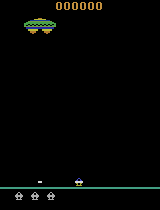

  5%|▍         | 493/10000 [00:13<04:11, 37.88it/s]


Avg Train Loss: 0.009410188484191895
Total Reward: 189.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▌         | 544/10000 [00:17<05:11, 30.40it/s]


Avg Train Loss: 0.014573775672912598
Total Reward: 273.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  7%|▋         | 654/10000 [00:25<06:07, 25.44it/s]


Avg Train Loss: 0.021008701452612875
Total Reward: 231.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▌         | 534/10000 [00:22<06:31, 24.21it/s]


Avg Train Loss: 0.01674660792350769
Total Reward: 168.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  6%|▌         | 622/10000 [00:28<07:13, 21.64it/s] 


Avg Train Loss: 0.022153366738557816
Total Reward: 189.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  7%|▋         | 736/10000 [00:31<06:41, 23.10it/s]


Avg Train Loss: 0.022630722236633302
Total Reward: 315.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▍         | 486/10000 [00:21<07:07, 22.24it/s]


Avg Train Loss: 0.015497183430194855
Total Reward: 231.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▍         | 478/10000 [00:20<06:44, 23.52it/s]


Avg Train Loss: 0.014886623686552048
Total Reward: 189.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▍         | 454/10000 [00:20<07:08, 22.27it/s]


Avg Train Loss: 0.01377830283343792
Total Reward: 147.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▌         | 544/10000 [00:23<06:48, 23.17it/s]


Avg Train Loss: 0.01683356466293335
Total Reward: 294.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


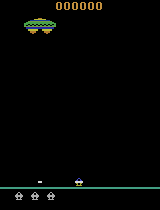

  7%|▋         | 718/10000 [00:34<07:23, 20.92it/s] 


Avg Train Loss: 0.02786171845048666
Total Reward: 336.0
Exploration Factor: epsilon: 0.9090909090909091
--------------------------------------------------


  6%|▌         | 614/10000 [00:31<07:58, 19.60it/s] 


Avg Train Loss: 0.024001437282562255
Total Reward: 252.0
Exploration Factor: epsilon: 0.8333333333333334
--------------------------------------------------


  7%|▋         | 673/10000 [00:30<07:03, 22.02it/s] 


Avg Train Loss: 0.02151416153907776
Total Reward: 315.0
Exploration Factor: epsilon: 0.7692307692307692
--------------------------------------------------


  9%|▉         | 902/10000 [00:46<07:47, 19.47it/s] 


Avg Train Loss: 0.034326659098267556
Total Reward: 336.0
Exploration Factor: epsilon: 0.7142857142857143
--------------------------------------------------


  8%|▊         | 781/10000 [00:37<07:27, 20.60it/s] 


Avg Train Loss: 0.0312344233751297
Total Reward: 273.0
Exploration Factor: epsilon: 0.6666666666666666
--------------------------------------------------


 10%|▉         | 957/10000 [00:47<07:31, 20.02it/s] 


Avg Train Loss: 0.03430277151837945
Total Reward: 378.0
Exploration Factor: epsilon: 0.625
--------------------------------------------------


 10%|▉         | 991/10000 [00:50<07:40, 19.57it/s] 


Avg Train Loss: 0.037995581150054934
Total Reward: 294.0
Exploration Factor: epsilon: 0.5882352941176471
--------------------------------------------------


  7%|▋         | 704/10000 [00:40<09:01, 17.18it/s] 


Avg Train Loss: 0.031246737572550774
Total Reward: 189.0
Exploration Factor: epsilon: 0.5555555555555556
--------------------------------------------------


  7%|▋         | 671/10000 [00:39<09:02, 17.20it/s] 


Avg Train Loss: 0.026186526426672935
Total Reward: 252.0
Exploration Factor: epsilon: 0.5263157894736842
--------------------------------------------------


 11%|█         | 1054/10000 [01:03<08:56, 16.66it/s]


Avg Train Loss: 0.046464703465998174
Total Reward: 231.0
Exploration Factor: epsilon: 0.5
--------------------------------------------------


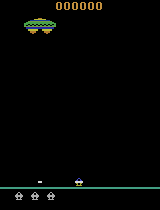

 13%|█▎        | 1294/10000 [01:15<08:29, 17.09it/s]


Avg Train Loss: 0.05069734319448471
Total Reward: 420.0
Exploration Factor: epsilon: 0.47619047619047616
--------------------------------------------------


  6%|▌         | 576/10000 [00:37<10:17, 15.27it/s] 


Avg Train Loss: 0.02129515998363495
Total Reward: 189.0
Exploration Factor: epsilon: 0.45454545454545453
--------------------------------------------------


 11%|█         | 1056/10000 [01:05<09:11, 16.22it/s]


Avg Train Loss: 0.04171968688964844
Total Reward: 315.0
Exploration Factor: epsilon: 0.4347826086956522
--------------------------------------------------


  6%|▋         | 640/10000 [00:40<09:58, 15.64it/s] 


Avg Train Loss: 0.025616855132579802
Total Reward: 189.0
Exploration Factor: epsilon: 0.4166666666666667
--------------------------------------------------


 11%|█         | 1086/10000 [01:12<09:54, 15.00it/s]


Avg Train Loss: 0.04395016940832138
Total Reward: 336.0
Exploration Factor: epsilon: 0.4
--------------------------------------------------


  8%|▊         | 832/10000 [00:59<11:00, 13.88it/s] 


Avg Train Loss: 0.03341229736208916
Total Reward: 168.0
Exploration Factor: epsilon: 0.3846153846153846
--------------------------------------------------


 10%|▉         | 950/10000 [01:05<10:19, 14.61it/s] 


Avg Train Loss: 0.03422748429179191
Total Reward: 315.0
Exploration Factor: epsilon: 0.37037037037037035
--------------------------------------------------


 11%|█▏        | 1126/10000 [01:19<10:25, 14.20it/s]


Avg Train Loss: 0.04068687686026096
Total Reward: 231.0
Exploration Factor: epsilon: 0.35714285714285715
--------------------------------------------------


 24%|██▍       | 2414/10000 [02:57<09:17, 13.60it/s]


Avg Train Loss: 0.08554548598229886
Total Reward: 588.0
Exploration Factor: epsilon: 0.3448275862068966
--------------------------------------------------


 14%|█▎        | 1358/10000 [02:00<12:47, 11.25it/s]


Avg Train Loss: 0.057451582324504855
Total Reward: 336.0
Exploration Factor: epsilon: 0.3333333333333333
--------------------------------------------------


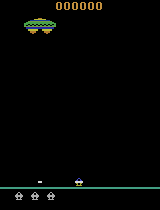

 13%|█▎        | 1280/10000 [01:47<12:14, 11.88it/s]


Avg Train Loss: 0.05180218471437693
Total Reward: 273.0
Exploration Factor: epsilon: 0.3225806451612903
--------------------------------------------------


  7%|▋         | 704/10000 [01:00<13:21, 11.59it/s] 


Avg Train Loss: 0.028317490363121034
Total Reward: 84.0
Exploration Factor: epsilon: 0.3125
--------------------------------------------------


 14%|█▍        | 1408/10000 [02:15<13:46, 10.40it/s]


Avg Train Loss: 0.05716085397899151
Total Reward: 252.0
Exploration Factor: epsilon: 0.30303030303030304
--------------------------------------------------


 19%|█▉        | 1902/10000 [02:38<11:16, 11.97it/s]


Avg Train Loss: 0.06518774717748164
Total Reward: 315.0
Exploration Factor: epsilon: 0.29411764705882354
--------------------------------------------------


 18%|█▊        | 1838/10000 [02:54<12:54, 10.53it/s]


Avg Train Loss: 0.06812064944058657
Total Reward: 378.0
Exploration Factor: epsilon: 0.2857142857142857
--------------------------------------------------


  5%|▌         | 544/10000 [00:58<16:52,  9.34it/s] 


Avg Train Loss: 0.019725093302130698
Total Reward: 168.0
Exploration Factor: epsilon: 0.2777777777777778
--------------------------------------------------


 11%|█         | 1054/10000 [01:50<15:39,  9.53it/s]


Avg Train Loss: 0.03925519862920046
Total Reward: 420.0
Exploration Factor: epsilon: 0.27027027027027023
--------------------------------------------------


  9%|▉         | 895/10000 [01:26<14:41, 10.33it/s] 


Avg Train Loss: 0.032725022453069685
Total Reward: 231.0
Exploration Factor: epsilon: 0.2631578947368421
--------------------------------------------------


  7%|▋         | 725/10000 [01:13<15:44,  9.82it/s] 


Avg Train Loss: 0.02969809678196907
Total Reward: 315.0
Exploration Factor: epsilon: 0.25641025641025644
--------------------------------------------------


  9%|▉         | 902/10000 [01:25<14:23, 10.53it/s] 


Avg Train Loss: 0.03392458513826132
Total Reward: 336.0
Exploration Factor: epsilon: 0.25
--------------------------------------------------


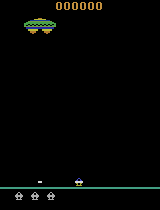

  6%|▌         | 576/10000 [00:52<14:22, 10.93it/s] 


Avg Train Loss: 0.025207603174448014
Total Reward: 252.0
Exploration Factor: epsilon: 0.24390243902439027
--------------------------------------------------


  8%|▊         | 773/10000 [00:53<10:40, 14.40it/s] 


Avg Train Loss: 0.028977638697624205
Total Reward: 336.0
Exploration Factor: epsilon: 0.23809523809523808
--------------------------------------------------


  7%|▋         | 726/10000 [01:07<14:23, 10.75it/s] 


Avg Train Loss: 0.03404293544888497
Total Reward: 336.0
Exploration Factor: epsilon: 0.23255813953488372
--------------------------------------------------


  8%|▊         | 837/10000 [01:05<12:01, 12.70it/s] 


Avg Train Loss: 0.035499213218688964
Total Reward: 378.0
Exploration Factor: epsilon: 0.22727272727272727
--------------------------------------------------


  8%|▊         | 790/10000 [01:00<11:45, 13.05it/s] 


Avg Train Loss: 0.03238900793790817
Total Reward: 231.0
Exploration Factor: epsilon: 0.2222222222222222
--------------------------------------------------


  7%|▋         | 685/10000 [00:43<09:57, 15.59it/s] 


Avg Train Loss: 0.02606524992287159
Total Reward: 210.0
Exploration Factor: epsilon: 0.2173913043478261
--------------------------------------------------


  8%|▊         | 846/10000 [00:53<09:37, 15.84it/s] 


Avg Train Loss: 0.03494522998631001
Total Reward: 336.0
Exploration Factor: epsilon: 0.2127659574468085
--------------------------------------------------


 10%|█         | 1021/10000 [01:04<09:30, 15.73it/s]


Avg Train Loss: 0.04488044416904449
Total Reward: 357.0
Exploration Factor: epsilon: 0.20833333333333334
--------------------------------------------------


 10%|▉         | 960/10000 [00:59<09:18, 16.18it/s] 


Avg Train Loss: 0.03912565394490957
Total Reward: 315.0
Exploration Factor: epsilon: 0.2040816326530612
--------------------------------------------------


 10%|▉         | 960/10000 [00:58<09:12, 16.35it/s] 


Avg Train Loss: 0.04177886872291565
Total Reward: 315.0
Exploration Factor: epsilon: 0.2
--------------------------------------------------


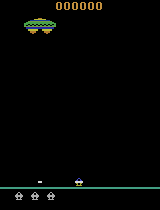

 12%|█▏        | 1157/10000 [01:14<09:31, 15.47it/s]


Avg Train Loss: 0.04983330707550049
Total Reward: 399.0
Exploration Factor: epsilon: 0.19607843137254904
--------------------------------------------------


 14%|█▍        | 1390/10000 [01:32<09:30, 15.08it/s]


Avg Train Loss: 0.06089927088916302
Total Reward: 483.0
Exploration Factor: epsilon: 0.1923076923076923
--------------------------------------------------


  9%|▊         | 864/10000 [01:01<10:51, 14.02it/s] 


Avg Train Loss: 0.03718170474767685
Total Reward: 378.0
Exploration Factor: epsilon: 0.18867924528301888
--------------------------------------------------


 23%|██▎       | 2280/10000 [02:42<09:11, 14.01it/s]


Avg Train Loss: 0.10424359838366508
Total Reward: 630.0
Exploration Factor: epsilon: 0.18518518518518517
--------------------------------------------------


 19%|█▉        | 1920/10000 [02:36<10:56, 12.30it/s]


Avg Train Loss: 0.09351731002479792
Total Reward: 357.0
Exploration Factor: epsilon: 0.18181818181818182
--------------------------------------------------


 41%|████▏     | 4126/10000 [06:15<08:54, 10.99it/s] 


Avg Train Loss: 0.2169471670985222
Total Reward: 546.0
Exploration Factor: epsilon: 0.17857142857142858
--------------------------------------------------


 16%|█▌        | 1606/10000 [03:07<16:21,  8.55it/s]  


Avg Train Loss: 0.09211601106822491
Total Reward: 399.0
Exploration Factor: epsilon: 0.17543859649122806
--------------------------------------------------


 23%|██▎       | 2303/10000 [04:10<13:57,  9.19it/s] 


Avg Train Loss: 0.12697026554346086
Total Reward: 336.0
Exploration Factor: epsilon: 0.1724137931034483
--------------------------------------------------


 18%|█▊        | 1760/10000 [04:13<19:45,  6.95it/s]  


Avg Train Loss: 0.09649314075186849
Total Reward: 189.0
Exploration Factor: epsilon: 0.1694915254237288
--------------------------------------------------


 41%|████▏     | 4130/10000 [09:13<13:07,  7.46it/s]  


Avg Train Loss: 0.20783744048699737
Total Reward: 483.0
Exploration Factor: epsilon: 0.16666666666666666
--------------------------------------------------


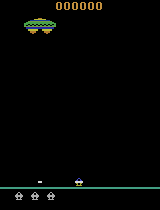

 29%|██▉       | 2945/10000 [07:17<17:28,  6.73it/s]  


Avg Train Loss: 0.1618888224348426
Total Reward: 525.0
Exploration Factor: epsilon: 0.1639344262295082
--------------------------------------------------


 17%|█▋        | 1664/10000 [03:58<19:56,  6.97it/s] 


Avg Train Loss: 0.0899913007169962
Total Reward: 399.0
Exploration Factor: epsilon: 0.16129032258064516
--------------------------------------------------


 20%|█▉        | 1952/10000 [05:26<22:28,  5.97it/s]  


Avg Train Loss: 0.10454266079962253
Total Reward: 189.0
Exploration Factor: epsilon: 0.15873015873015872
--------------------------------------------------


  9%|▉         | 918/10000 [02:52<28:31,  5.31it/s]  


Avg Train Loss: 0.048080147361010316
Total Reward: 189.0
Exploration Factor: epsilon: 0.15625
--------------------------------------------------


 22%|██▏       | 2176/10000 [05:29<19:45,  6.60it/s] 


Avg Train Loss: 0.09490141497552394
Total Reward: 399.0
Exploration Factor: epsilon: 0.15384615384615385
--------------------------------------------------


 26%|██▌       | 2560/10000 [07:31<21:51,  5.67it/s]  


Avg Train Loss: 0.12400500325113535
Total Reward: 399.0
Exploration Factor: epsilon: 0.15151515151515152
--------------------------------------------------


 27%|██▋       | 2661/10000 [07:10<19:48,  6.18it/s]  


Avg Train Loss: 0.11877653918042778
Total Reward: 525.0
Exploration Factor: epsilon: 0.14925373134328357
--------------------------------------------------


  5%|▌         | 510/10000 [01:29<27:44,  5.70it/s]  


Avg Train Loss: 0.02555719204097986
Total Reward: 210.0
Exploration Factor: epsilon: 0.14705882352941177
--------------------------------------------------


 16%|█▌        | 1606/10000 [03:58<20:48,  6.73it/s]  


Avg Train Loss: 0.07438115045875311
Total Reward: 399.0
Exploration Factor: epsilon: 0.14492753623188406
--------------------------------------------------


 10%|█         | 1026/10000 [02:46<24:13,  6.17it/s]  


Avg Train Loss: 0.050072494404390454
Total Reward: 420.0
Exploration Factor: epsilon: 0.14285714285714285
--------------------------------------------------


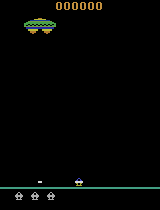

  8%|▊         | 801/10000 [01:58<22:46,  6.73it/s] 


Avg Train Loss: 0.04165905691534281
Total Reward: 441.0
Exploration Factor: epsilon: 0.14084507042253522
--------------------------------------------------


  6%|▋         | 637/10000 [01:16<18:50,  8.28it/s] 


Avg Train Loss: 0.029870786613225935
Total Reward: 231.0
Exploration Factor: epsilon: 0.1388888888888889
--------------------------------------------------


  7%|▋         | 678/10000 [01:11<16:25,  9.46it/s] 


Avg Train Loss: 0.030674740405380724
Total Reward: 273.0
Exploration Factor: epsilon: 0.136986301369863
--------------------------------------------------


  8%|▊         | 790/10000 [01:24<16:27,  9.33it/s] 


Avg Train Loss: 0.03601789310574532
Total Reward: 483.0
Exploration Factor: epsilon: 0.13513513513513511
--------------------------------------------------


  7%|▋         | 726/10000 [01:18<16:38,  9.29it/s] 


Avg Train Loss: 0.039981840550899504
Total Reward: 420.0
Exploration Factor: epsilon: 0.13333333333333333
--------------------------------------------------


  6%|▋         | 629/10000 [01:12<17:58,  8.69it/s] 


Avg Train Loss: 0.033000623190402985
Total Reward: 315.0
Exploration Factor: epsilon: 0.13157894736842105
--------------------------------------------------


  7%|▋         | 702/10000 [00:48<10:40, 14.52it/s] 


Avg Train Loss: 0.03956767064332962
Total Reward: 420.0
Exploration Factor: epsilon: 0.12987012987012986
--------------------------------------------------


  5%|▌         | 534/10000 [00:34<10:17, 15.33it/s] 


Avg Train Loss: 0.02558446501493454
Total Reward: 252.0
Exploration Factor: epsilon: 0.12820512820512822
--------------------------------------------------


 12%|█▏        | 1216/10000 [01:29<10:43, 13.65it/s]


Avg Train Loss: 0.06375638926029205
Total Reward: 378.0
Exploration Factor: epsilon: 0.10309278350515465
--------------------------------------------------


 16%|█▌        | 1612/10000 [01:58<10:18, 13.56it/s]


Avg Train Loss: 0.0808217216849327
Total Reward: 651.0
Exploration Factor: epsilon: 0.1020408163265306
--------------------------------------------------


  8%|▊         | 790/10000 [01:06<12:52, 11.92it/s] 


Avg Train Loss: 0.04327326803803444
Total Reward: 336.0
Exploration Factor: epsilon: 0.10101010101010101
--------------------------------------------------


  9%|▉         | 925/10000 [01:14<12:12, 12.39it/s] 


Avg Train Loss: 0.05271015045642853
Total Reward: 336.0
Exploration Factor: epsilon: 0.1
--------------------------------------------------


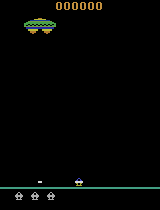

  8%|▊         | 800/10000 [01:05<12:32, 12.22it/s] 


Avg Train Loss: 0.041389962434768675
Total Reward: 336.0
Exploration Factor: epsilon: 0.09900990099009901
--------------------------------------------------


  9%|▉         | 886/10000 [01:12<12:23, 12.25it/s] 


Avg Train Loss: 0.04724796226024627
Total Reward: 399.0
Exploration Factor: epsilon: 0.09803921568627452
--------------------------------------------------


  9%|▉         | 878/10000 [01:13<12:47, 11.89it/s] 


Avg Train Loss: 0.04840713105201721
Total Reward: 378.0
Exploration Factor: epsilon: 0.0970873786407767
--------------------------------------------------


  5%|▌         | 512/10000 [00:42<13:15, 11.92it/s] 


Avg Train Loss: 0.02960776410102844
Total Reward: 231.0
Exploration Factor: epsilon: 0.09615384615384615
--------------------------------------------------


 10%|▉         | 960/10000 [01:08<10:42, 14.07it/s] 


Avg Train Loss: 0.0458501305103302
Total Reward: 252.0
Exploration Factor: epsilon: 0.09523809523809523
--------------------------------------------------


 11%|█         | 1062/10000 [01:19<11:11, 13.31it/s]


Avg Train Loss: 0.05193606579303742
Total Reward: 399.0
Exploration Factor: epsilon: 0.09433962264150944
--------------------------------------------------


  6%|▌         | 576/10000 [00:41<11:18, 13.88it/s] 


Avg Train Loss: 0.025660582733154295
Total Reward: 189.0
Exploration Factor: epsilon: 0.09345794392523366
--------------------------------------------------


 16%|█▌        | 1566/10000 [01:49<09:48, 14.32it/s]


Avg Train Loss: 0.07013826351165771
Total Reward: 588.0
Exploration Factor: epsilon: 0.09259259259259259
--------------------------------------------------


 15%|█▌        | 1502/10000 [01:44<09:51, 14.38it/s]


Avg Train Loss: 0.07260653784275055
Total Reward: 399.0
Exploration Factor: epsilon: 0.09174311926605504
--------------------------------------------------


 11%|█         | 1109/10000 [01:23<11:09, 13.28it/s]


Avg Train Loss: 0.052777471375465394
Total Reward: 357.0
Exploration Factor: epsilon: 0.09090909090909091
--------------------------------------------------


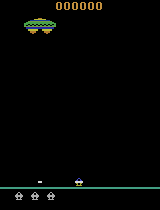

 19%|█▊        | 1856/10000 [02:11<09:35, 14.14it/s]


Avg Train Loss: 0.08084099105298519
Total Reward: 420.0
Exploration Factor: epsilon: 0.0900900900900901
--------------------------------------------------


 14%|█▍        | 1405/10000 [02:05<12:46, 11.21it/s]


Avg Train Loss: 0.07068541588783264
Total Reward: 525.0
Exploration Factor: epsilon: 0.08928571428571429
--------------------------------------------------


  9%|▉         | 925/10000 [01:20<13:11, 11.47it/s] 


Avg Train Loss: 0.045768625140190124
Total Reward: 378.0
Exploration Factor: epsilon: 0.08849557522123894
--------------------------------------------------


  6%|▋         | 640/10000 [00:55<13:33, 11.50it/s] 


Avg Train Loss: 0.03181952893733978
Total Reward: 273.0
Exploration Factor: epsilon: 0.08771929824561403
--------------------------------------------------


 10%|█         | 1038/10000 [01:40<14:27, 10.33it/s]


Avg Train Loss: 0.055956325703859326
Total Reward: 378.0
Exploration Factor: epsilon: 0.08695652173913043
--------------------------------------------------


 10%|█         | 1014/10000 [01:39<14:37, 10.24it/s]


Avg Train Loss: 0.05481846568584442
Total Reward: 525.0
Exploration Factor: epsilon: 0.08620689655172414
--------------------------------------------------


In [ ]:
# model params
eps_mem_size = 10
num_lstm_hidden_layers = 8
batch_size = 512
ep_window_size = 3
l_rate = 0.005
epsilon_decay = 0.9999

epMem, model, agent = initialize_model(eps_mem_size, num_lstm_hidden_layers, batch_size, ep_window_size, l_rate, epsilon_decay)

# train params
SHOOTING_FACTOR=0.2
SHOOT_WINDOW=5
num_of_episodes = 200
time_step_size = 10000
window_size = 3
show_gifs = True
gif_show_frequency = 10
csvfile_name = 'case_1.csv'

perform_train_with_stepLR(num_of_episodes, time_step_size, window_size, show_gifs, gif_show_frequency, csvfile_name)

### Seeing the Variation of Reward over Number of episodes for which agent is trained

In [ ]:
!pip install pandas
import pandas as pd
df = pd.read_csv('./case-1.csv', header=None)

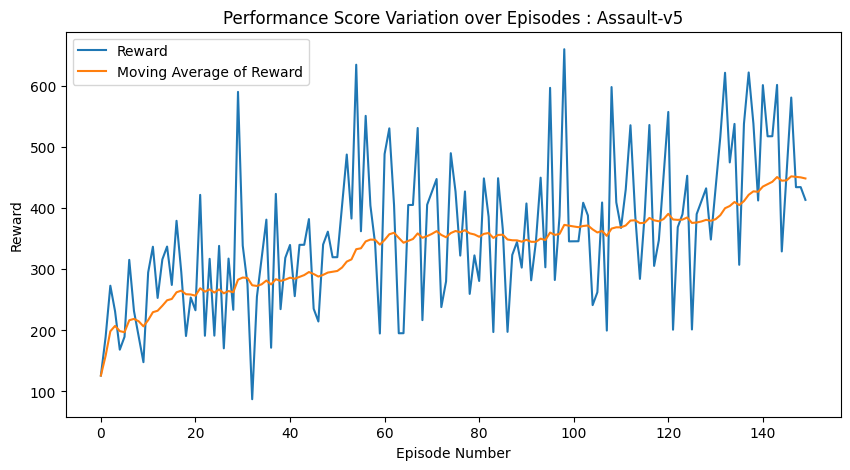

In [ ]:
NUMBER_OF_EPISODE_BOUND = 150
WINDOW_FOR_MOVING_AVG = 40
index_vector = range(NUMBER_OF_EPISODE_BOUND)

plt.figure(figsize=(10,5))

df["evm_avg"] = df[0].ewm(span=40).mean() # calculate the exponentially weighted moving average
plt.title("Performance Score Variation over Episodes : Assault-v5")
plt.plot(index_vector, df[0][:NUMBER_OF_EPISODE_BOUND], label="Reward")
plt.plot(index_vector, df["evm_avg"][:NUMBER_OF_EPISODE_BOUND], label="Moving Average of Reward")
plt.xlabel("Episode Number")
plt.ylabel("Reward")
plt.legend()
plt.show()

### We can see that the model is learning to improve its gameplay, and as the number of episodes for which it plays we see that increase in moving averages of the reward, we can say that our agent is learning to play the game. We should expect the game to improve as the number of episodes for it trains increases

### We noticed that for a mere 150 episodes took an exceedingly large amount of time as well as GPU memory (16 GB Nvidia T4), to compare we will use only 40 episodes due to lack of better compute infrastructure and to demonstrate our proposed solution

## Case 2 : Performance of Assault-v5 for CosineAnnealingWithWarmRestarts, With Modified Reward Function

  6%|▌         | 590/10000 [00:04<01:19, 118.12it/s]


Current Learning Rate: [0.001975528258147577]
Avg Train Loss: 0.0
Total Reward: 336.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


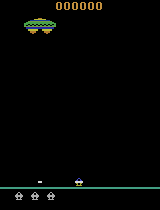

  6%|▌         | 582/10000 [00:32<08:51, 17.72it/s]


Current Learning Rate: [0.0019045084971874738]
Avg Train Loss: 0.02917305326461792
Total Reward: 147.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▌         | 502/10000 [00:33<10:30, 15.06it/s]


Current Learning Rate: [0.0017938926261462365]
Avg Train Loss: 0.024229019594192505
Total Reward: 210.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  4%|▎         | 352/10000 [00:26<12:00, 13.39it/s]


Current Learning Rate: [0.0016545084971874738]
Avg Train Loss: 0.014467033842206002
Total Reward: 168.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  6%|▌         | 622/10000 [00:33<08:26, 18.52it/s]


Current Learning Rate: [0.0015]
Avg Train Loss: 0.021482535314559938
Total Reward: 189.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▌         | 544/10000 [00:34<10:00, 15.74it/s]


Current Learning Rate: [0.0013454915028125263]
Avg Train Loss: 0.018253942704200745
Total Reward: 189.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  3%|▎         | 342/10000 [00:18<08:49, 18.23it/s]


Current Learning Rate: [0.0012061073738537636]
Avg Train Loss: 0.013725026941299439
Total Reward: 63.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▌         | 544/10000 [00:29<08:28, 18.58it/s]


Current Learning Rate: [0.0010954915028125263]
Avg Train Loss: 0.014586385503411294
Total Reward: 189.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  4%|▍         | 384/10000 [00:20<08:24, 19.07it/s]


Current Learning Rate: [0.0010244717418524233]
Avg Train Loss: 0.00869984555542469
Total Reward: 105.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▍         | 480/10000 [00:25<08:25, 18.84it/s]


Current Learning Rate: [0.002]
Avg Train Loss: 0.014437956172227859
Total Reward: 147.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  3%|▎         | 342/10000 [00:19<08:56, 17.99it/s]


Current Learning Rate: [0.001975528258147577]
Avg Train Loss: 0.011447078990936279
Total Reward: 189.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


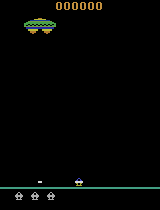

  7%|▋         | 654/10000 [00:31<07:33, 20.61it/s]


Current Learning Rate: [0.0019045084971874738]
Avg Train Loss: 0.01601301028728485
Total Reward: 273.0
Exploration Factor: epsilon: 0.9090909090909091
--------------------------------------------------


  6%|▌         | 598/10000 [00:30<07:55, 19.75it/s]


Current Learning Rate: [0.0017938926261462365]
Avg Train Loss: 0.015655131840705872
Total Reward: 210.0
Exploration Factor: epsilon: 0.8333333333333334
--------------------------------------------------


  7%|▋         | 661/10000 [00:32<07:40, 20.27it/s]


Current Learning Rate: [0.0016545084971874738]
Avg Train Loss: 0.015524236631393433
Total Reward: 294.0
Exploration Factor: epsilon: 0.7692307692307692
--------------------------------------------------


  5%|▌         | 512/10000 [00:32<10:02, 15.74it/s]


Current Learning Rate: [0.0015]
Avg Train Loss: 0.015088401439785957
Total Reward: 189.0
Exploration Factor: epsilon: 0.7142857142857143
--------------------------------------------------


  8%|▊         | 837/10000 [00:48<08:48, 17.33it/s]


Current Learning Rate: [0.0013454915028125263]
Avg Train Loss: 0.025245252951979637
Total Reward: 294.0
Exploration Factor: epsilon: 0.6666666666666666
--------------------------------------------------


  5%|▌         | 544/10000 [00:31<09:01, 17.45it/s]


Current Learning Rate: [0.0012061073738537636]
Avg Train Loss: 0.017207829511165618
Total Reward: 126.0
Exploration Factor: epsilon: 0.625
--------------------------------------------------


  6%|▌         | 565/10000 [00:41<11:36, 13.55it/s]


Current Learning Rate: [0.0010954915028125263]
Avg Train Loss: 0.01845347820520401
Total Reward: 147.0
Exploration Factor: epsilon: 0.5882352941176471
--------------------------------------------------


  9%|▉         | 878/10000 [00:57<09:55, 15.31it/s]


Current Learning Rate: [0.0010244717418524233]
Avg Train Loss: 0.025743055245280266
Total Reward: 189.0
Exploration Factor: epsilon: 0.5555555555555556
--------------------------------------------------


  9%|▉         | 896/10000 [01:18<13:20, 11.38it/s]


Current Learning Rate: [0.002]
Avg Train Loss: 0.027347097954154014
Total Reward: 189.0
Exploration Factor: epsilon: 0.5263157894736842
--------------------------------------------------


  6%|▌         | 550/10000 [00:45<13:01, 12.09it/s]


Current Learning Rate: [0.001975528258147577]
Avg Train Loss: 0.01743021350353956
Total Reward: 189.0
Exploration Factor: epsilon: 0.5
--------------------------------------------------


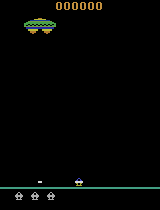

  8%|▊         | 782/10000 [01:00<11:52, 12.94it/s]


Current Learning Rate: [0.0019045084971874738]
Avg Train Loss: 0.02664428281188011
Total Reward: 315.0
Exploration Factor: epsilon: 0.47619047619047616
--------------------------------------------------


 13%|█▎        | 1277/10000 [01:31<10:25, 13.95it/s]


Current Learning Rate: [0.0017938926261462365]
Avg Train Loss: 0.03905473970621824
Total Reward: 378.0
Exploration Factor: epsilon: 0.45454545454545453
--------------------------------------------------


 13%|█▎        | 1326/10000 [01:42<11:07, 13.00it/s]


Current Learning Rate: [0.0016545084971874738]
Avg Train Loss: 0.047637067091464994
Total Reward: 294.0
Exploration Factor: epsilon: 0.4347826086956522
--------------------------------------------------


  8%|▊         | 806/10000 [01:11<13:35, 11.28it/s]


Current Learning Rate: [0.0015]
Avg Train Loss: 0.031950079959630964
Total Reward: 168.0
Exploration Factor: epsilon: 0.4166666666666667
--------------------------------------------------


  3%|▎         | 320/10000 [00:34<17:21,  9.29it/s]


Current Learning Rate: [0.0013454915028125263]
Avg Train Loss: 0.016342900562286378
Total Reward: 105.0
Exploration Factor: epsilon: 0.4
--------------------------------------------------


 13%|█▎        | 1318/10000 [01:41<11:07, 13.00it/s]


Current Learning Rate: [0.0012061073738537636]
Avg Train Loss: 0.041500065004825594
Total Reward: 378.0
Exploration Factor: epsilon: 0.3846153846153846
--------------------------------------------------


  6%|▋         | 630/10000 [01:01<15:08, 10.32it/s]


Current Learning Rate: [0.0010954915028125263]
Avg Train Loss: 0.022489438092708588
Total Reward: 168.0
Exploration Factor: epsilon: 0.37037037037037035
--------------------------------------------------


 12%|█▏        | 1152/10000 [01:37<12:25, 11.87it/s]


Current Learning Rate: [0.0010244717418524233]
Avg Train Loss: 0.04459335758686066
Total Reward: 231.0
Exploration Factor: epsilon: 0.35714285714285715
--------------------------------------------------


 10%|▉         | 966/10000 [01:19<12:21, 12.19it/s]


Current Learning Rate: [0.002]
Avg Train Loss: 0.03317393054962158
Total Reward: 231.0
Exploration Factor: epsilon: 0.3448275862068966
--------------------------------------------------


  7%|▋         | 704/10000 [01:05<14:24, 10.75it/s]


Current Learning Rate: [0.001975528258147577]
Avg Train Loss: 0.028204580688476564
Total Reward: 189.0
Exploration Factor: epsilon: 0.3333333333333333
--------------------------------------------------


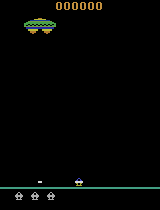

 14%|█▎        | 1374/10000 [01:51<11:40, 12.31it/s]


Current Learning Rate: [0.0019045084971874738]
Avg Train Loss: 0.04725101243108511
Total Reward: 399.0
Exploration Factor: epsilon: 0.3225806451612903
--------------------------------------------------


  5%|▌         | 544/10000 [00:54<15:45, 10.00it/s]


Current Learning Rate: [0.0017938926261462365]
Avg Train Loss: 0.020557312595844267
Total Reward: 126.0
Exploration Factor: epsilon: 0.3125
--------------------------------------------------


  6%|▋         | 630/10000 [00:58<14:35, 10.70it/s]


Current Learning Rate: [0.0016545084971874738]
Avg Train Loss: 0.022391349291801452
Total Reward: 168.0
Exploration Factor: epsilon: 0.30303030303030304
--------------------------------------------------


 15%|█▍        | 1454/10000 [02:01<11:56, 11.92it/s]


Current Learning Rate: [0.0015]
Avg Train Loss: 0.050344923941791055
Total Reward: 399.0
Exploration Factor: epsilon: 0.29411764705882354
--------------------------------------------------


  5%|▌         | 544/10000 [00:51<14:59, 10.51it/s]


Current Learning Rate: [0.0013454915028125263]
Avg Train Loss: 0.02051465302705765
Total Reward: 105.0
Exploration Factor: epsilon: 0.2857142857142857
--------------------------------------------------


 11%|█         | 1117/10000 [01:43<13:45, 10.76it/s]


Current Learning Rate: [0.0012061073738537636]
Avg Train Loss: 0.04173661461025476
Total Reward: 210.0
Exploration Factor: epsilon: 0.2777777777777778
--------------------------------------------------


  2%|▏         | 192/10000 [00:17<14:36, 11.18it/s]


Current Learning Rate: [0.0010954915028125263]
Avg Train Loss: 0.006246150422096253
Total Reward: 84.0
Exploration Factor: epsilon: 0.27027027027027023
--------------------------------------------------


  9%|▉         | 928/10000 [01:24<13:43, 11.02it/s]


Current Learning Rate: [0.0010244717418524233]
Avg Train Loss: 0.028247758378088475
Total Reward: 189.0
Exploration Factor: epsilon: 0.2631578947368421
--------------------------------------------------


 12%|█▏        | 1184/10000 [01:44<12:56, 11.35it/s]

Current Learning Rate: [0.002]
Avg Train Loss: 0.03975927425324917
Total Reward: 273.0
Exploration Factor: epsilon: 0.25641025641025644
--------------------------------------------------


In [ ]:
# model params
eps_mem_size = 10
num_lstm_hidden_layers = 8
batch_size = 512
ep_window_size = 3
l_rate = 0.002
epsilon_decay = 0.8

epMem, model, agent = initialize_model(eps_mem_size, num_lstm_hidden_layers, batch_size, ep_window_size, l_rate, epsilon_decay)

# train params
SHOOTING_FACTOR=0.2
SHOOT_WINDOW=5
num_of_episodes = 40
time_step_size = 10000
window_size = 3
show_gifs = True
gif_show_frequency = 10
csvfile_name = 'case-2.csv'

perform_train_with_CosineAnnealingWarmRestarts(num_of_episodes, time_step_size, window_size, show_gifs, gif_show_frequency, csvfile_name)

## Case 3 : Performance of Assault-v5 for StepLR, With Vanilla DRQN Reward Function (mentioned in Paper)

In [ ]:
class EpisodicMemory:
    def __init__(self, MAX_LENGTH=5000):
        self.memory = []
        self.episode_memory = []
        self.MAX_LENGTH = MAX_LENGTH

    def start_episode(self):
        self.episode_memory = []

    def end_episode(self):
        # Here we comment out the incentivization to use the original vanilla reward function
        '''
        # Modified reward function which incentivizes frequency of shooting, time for which the agent is alive
        last_time_shot=0
        for i in range(len(self.episode_memory)):
            if self.episode_memory[i][2] in [1]:
                last_time_shot=i
            penalty=1/(np.exp((i-last_time_shot)/SHOOT_WINDOW)+1)
            self.episode_memory[i][3] += (len(self.episode_memory) - i)/10000 + penalty*SHOOTING_FACTOR
        '''

        self.memory.append(self.episode_memory.copy())
        if len(self.memory) > self.MAX_LENGTH:
            self.memory.pop(0)

    def remember(self, state, next_state, action, reward, done):
        self.episode_memory.append([state, next_state, action, reward, done])

    def sample(self, episode_size):
        batch = []
        if(len(self.memory) == 0):
            return batch
        for _ in range(episode_size):
            index = np.random.randint(0, len(self.memory))
            batch = batch + self.memory[index]
        return batch

  6%|▌         | 574/10000 [00:03<01:04, 146.27it/s]


Current Learning Rate: [0.005]
Avg Train Loss: 0.0
Total Reward: 210.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


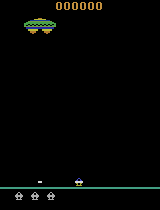

  4%|▍         | 416/10000 [00:22<08:44, 18.29it/s] 


Current Learning Rate: [0.005]
Avg Train Loss: 0.01507482476234436
Total Reward: 168.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  6%|▌         | 622/10000 [00:27<06:52, 22.72it/s] 


Current Learning Rate: [5e-05]
Avg Train Loss: 0.01823962015211582
Total Reward: 294.0
Exploration Factor: epsilon: 0.7071067811865475
--------------------------------------------------


  7%|▋         | 693/10000 [00:31<06:56, 22.34it/s] 


Current Learning Rate: [0.0005]
Avg Train Loss: 0.022476663402467966
Total Reward: 168.0
Exploration Factor: epsilon: 0.5773502691896258
--------------------------------------------------


  6%|▋         | 645/10000 [00:31<07:34, 20.57it/s] 


Current Learning Rate: [0.0005]
Avg Train Loss: 0.018916775846481323
Total Reward: 147.0
Exploration Factor: epsilon: 0.5
--------------------------------------------------


 12%|█▏        | 1216/10000 [01:00<07:14, 20.23it/s]


Current Learning Rate: [5e-06]
Avg Train Loss: 0.03601762285232544
Total Reward: 231.0
Exploration Factor: epsilon: 0.4472135954999579
--------------------------------------------------


  5%|▌         | 526/10000 [00:27<08:16, 19.06it/s]


Current Learning Rate: [5e-05]
Avg Train Loss: 0.017178194427490235
Total Reward: 168.0
Exploration Factor: epsilon: 0.4082482904638631
--------------------------------------------------


 13%|█▎        | 1254/10000 [01:10<08:10, 17.85it/s]


Current Learning Rate: [5e-05]
Avg Train Loss: 0.03351982383728027
Total Reward: 189.0
Exploration Factor: epsilon: 0.3779644730092272
--------------------------------------------------


 12%|█▏        | 1248/10000 [01:17<09:04, 16.07it/s]


Current Learning Rate: [5.000000000000001e-07]
Avg Train Loss: 0.034021569039300086
Total Reward: 336.0
Exploration Factor: epsilon: 0.35355339059327373
--------------------------------------------------


  7%|▋         | 736/10000 [00:54<11:28, 13.45it/s] 


Current Learning Rate: [5e-06]
Avg Train Loss: 0.025488918920606375
Total Reward: 189.0
Exploration Factor: epsilon: 0.3333333333333333
--------------------------------------------------


 10%|█         | 1005/10000 [01:05<09:47, 15.31it/s]


Current Learning Rate: [5e-06]
Avg Train Loss: 0.032662592932581905
Total Reward: 378.0
Exploration Factor: epsilon: 0.31622776601683794
--------------------------------------------------


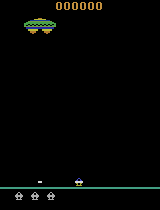

  4%|▎         | 352/10000 [00:21<09:39, 16.65it/s] 


Current Learning Rate: [5.000000000000001e-08]
Avg Train Loss: 0.009980959360674023
Total Reward: 42.0
Exploration Factor: epsilon: 0.30151134457776363
--------------------------------------------------


  6%|▋         | 640/10000 [00:40<09:57, 15.67it/s] 


Current Learning Rate: [5.000000000000001e-07]
Avg Train Loss: 0.018278146684169768
Total Reward: 105.0
Exploration Factor: epsilon: 0.2886751345948129
--------------------------------------------------


 15%|█▌        | 1541/10000 [01:37<08:52, 15.87it/s]


Current Learning Rate: [5.000000000000001e-07]
Avg Train Loss: 0.04611020330823958
Total Reward: 420.0
Exploration Factor: epsilon: 0.2773500981126146
--------------------------------------------------


  7%|▋         | 672/10000 [00:41<09:33, 16.27it/s] 


Current Learning Rate: [5.000000000000002e-09]
Avg Train Loss: 0.01766609500274062
Total Reward: 126.0
Exploration Factor: epsilon: 0.2672612419124244
--------------------------------------------------


 13%|█▎        | 1344/10000 [01:44<11:10, 12.91it/s]


Current Learning Rate: [5.000000000000001e-08]
Avg Train Loss: 0.0476580484226346
Total Reward: 189.0
Exploration Factor: epsilon: 0.2581988897471611
--------------------------------------------------


  6%|▌         | 576/10000 [00:38<10:36, 14.80it/s] 


Current Learning Rate: [5.000000000000001e-08]
Avg Train Loss: 0.016454580045491458
Total Reward: 189.0
Exploration Factor: epsilon: 0.25
--------------------------------------------------


  2%|▏         | 160/10000 [00:14<14:44, 11.12it/s] 


Current Learning Rate: [5.000000000000002e-10]
Avg Train Loss: 0.006287326407432556
Total Reward: 0.0
Exploration Factor: epsilon: 0.24253562503633297
--------------------------------------------------


 14%|█▍        | 1375/10000 [01:26<09:02, 15.90it/s]


Current Learning Rate: [5.000000000000002e-09]
Avg Train Loss: 0.03640352911539376
Total Reward: 336.0
Exploration Factor: epsilon: 0.23570226039551587
--------------------------------------------------


 21%|██        | 2080/10000 [02:17<08:45, 15.09it/s]


Current Learning Rate: [5.000000000000002e-09]
Avg Train Loss: 0.05695801326148212
Total Reward: 399.0
Exploration Factor: epsilon: 0.22941573387056174
--------------------------------------------------


 19%|█▊        | 1857/10000 [02:13<09:46, 13.89it/s]


Current Learning Rate: [5.000000000000003e-11]
Avg Train Loss: 0.05252113956026733
Total Reward: 420.0
Exploration Factor: epsilon: 0.22360679774997896
--------------------------------------------------


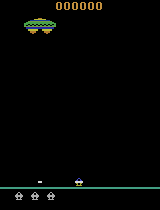

 17%|█▋        | 1728/10000 [02:15<10:49, 12.74it/s]


Current Learning Rate: [5.000000000000002e-10]
Avg Train Loss: 0.052510862968117
Total Reward: 273.0
Exploration Factor: epsilon: 0.2182178902359924
--------------------------------------------------


  8%|▊         | 832/10000 [01:20<14:44, 10.37it/s] 


Current Learning Rate: [5.000000000000002e-10]
Avg Train Loss: 0.03045291001200676
Total Reward: 63.0
Exploration Factor: epsilon: 0.21320071635561041
--------------------------------------------------


 28%|██▊       | 2752/10000 [04:16<11:15, 10.74it/s]


Current Learning Rate: [5.000000000000003e-12]
Avg Train Loss: 0.09137053717263043
Total Reward: 399.0
Exploration Factor: epsilon: 0.20851441405707477
--------------------------------------------------


 19%|█▊        | 1856/10000 [03:11<14:00,  9.69it/s]


Current Learning Rate: [5.000000000000003e-11]
Avg Train Loss: 0.058340169671922924
Total Reward: 273.0
Exploration Factor: epsilon: 0.20412414523193154
--------------------------------------------------


 51%|█████     | 5090/10000 [09:06<08:46,  9.32it/s] 


Current Learning Rate: [5.000000000000003e-11]
Avg Train Loss: 0.17576495832540096
Total Reward: 609.0
Exploration Factor: epsilon: 0.2
--------------------------------------------------


  9%|▉         | 896/10000 [02:00<20:29,  7.41it/s]  


Current Learning Rate: [5.000000000000003e-13]
Avg Train Loss: 0.035830948901176454
Total Reward: 126.0
Exploration Factor: epsilon: 0.19611613513818404
--------------------------------------------------


 25%|██▍       | 2498/10000 [05:12<15:38,  7.99it/s]  


Current Learning Rate: [5.000000000000003e-12]
Avg Train Loss: 0.08728315809965134
Total Reward: 462.0
Exploration Factor: epsilon: 0.19245008972987526
--------------------------------------------------


 14%|█▍        | 1376/10000 [03:48<23:49,  6.03it/s]  


Current Learning Rate: [5.000000000000003e-12]
Avg Train Loss: 0.06255846277065576
Total Reward: 189.0
Exploration Factor: epsilon: 0.1889822365046136
--------------------------------------------------


 10%|█         | 1024/10000 [03:00<26:26,  5.66it/s]  


Current Learning Rate: [5.000000000000003e-14]
Avg Train Loss: 0.05090964781343937
Total Reward: 126.0
Exploration Factor: epsilon: 0.18569533817705186
--------------------------------------------------


 22%|██▏       | 2207/10000 [05:32<19:32,  6.65it/s]  


Current Learning Rate: [5.000000000000003e-13]
Avg Train Loss: 0.08823901341073215
Total Reward: 252.0
Exploration Factor: epsilon: 0.18257418583505536
--------------------------------------------------


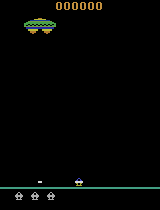

 11%|█         | 1088/10000 [02:23<19:32,  7.60it/s] 


Current Learning Rate: [5.000000000000003e-13]
Avg Train Loss: 0.03445303788613528
Total Reward: 315.0
Exploration Factor: epsilon: 0.1796053020267749
--------------------------------------------------


 45%|████▍     | 4481/10000 [10:47<13:17,  6.92it/s]  


Current Learning Rate: [5.000000000000004e-15]
Avg Train Loss: 0.16105147757418453
Total Reward: 546.0
Exploration Factor: epsilon: 0.17677669529663687
--------------------------------------------------


 25%|██▍       | 2464/10000 [07:52<24:04,  5.22it/s]  


Current Learning Rate: [5.000000000000003e-14]
Avg Train Loss: 0.11504328918121755
Total Reward: 210.0
Exploration Factor: epsilon: 0.17407765595569785
--------------------------------------------------


 14%|█▍        | 1376/10000 [03:41<23:09,  6.21it/s]  


Current Learning Rate: [5.000000000000003e-14]
Avg Train Loss: 0.055856314430572096
Total Reward: 189.0
Exploration Factor: epsilon: 0.17149858514250882
--------------------------------------------------


 13%|█▎        | 1312/10000 [04:11<27:45,  5.22it/s]  


Current Learning Rate: [5.000000000000004e-16]
Avg Train Loss: 0.056328655158542094
Total Reward: 168.0
Exploration Factor: epsilon: 0.1690308509457033
--------------------------------------------------


 33%|███▎      | 3264/10000 [07:34<15:38,  7.18it/s]  


Current Learning Rate: [5.000000000000004e-15]
Avg Train Loss: 0.11707932895943522
Total Reward: 399.0
Exploration Factor: epsilon: 0.16666666666666666
--------------------------------------------------


 44%|████▎     | 4354/10000 [11:23<14:46,  6.37it/s]  


Current Learning Rate: [5.000000000000004e-15]
Avg Train Loss: 0.16319630028158427
Total Reward: 504.0
Exploration Factor: epsilon: 0.1643989873053573
--------------------------------------------------


 29%|██▉       | 2880/10000 [08:08<20:06,  5.90it/s]  


Current Learning Rate: [5.000000000000005e-17]
Avg Train Loss: 0.10580172462388873
Total Reward: 294.0
Exploration Factor: epsilon: 0.16222142113076254
--------------------------------------------------


 32%|███▏      | 3168/10000 [09:25<20:19,  5.60it/s]  


Current Learning Rate: [5.000000000000004e-16]
Avg Train Loss: 0.11804435300137847
Total Reward: 252.0
Exploration Factor: epsilon: 0.16012815380508713
--------------------------------------------------


 13%|█▎        | 1344/10000 [04:11<26:56,  5.35it/s]  


Current Learning Rate: [5.000000000000004e-16]
Avg Train Loss: 0.05287198405377567
Total Reward: 84.0
Exploration Factor: epsilon: 0.15811388300841897
--------------------------------------------------


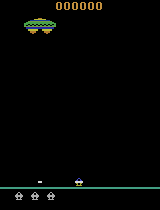

  8%|▊         | 832/10000 [03:04<33:54,  4.51it/s]  


Current Learning Rate: [5.000000000000005e-18]
Avg Train Loss: 0.0374295719191432
Total Reward: 105.0
Exploration Factor: epsilon: 0.15617376188860607
--------------------------------------------------


In [ ]:
# model params
eps_mem_size = 10
num_lstm_hidden_layers = 8
batch_size = 512
ep_window_size = 3
l_rate = 0.005
epsilon_decay = 0.8

epMem, model, agent = initialize_model(eps_mem_size, num_lstm_hidden_layers, batch_size, ep_window_size, l_rate, epsilon_decay)

# train params
SHOOTING_FACTOR=0.2
SHOOT_WINDOW=5
num_of_episodes = 200
time_step_size = 10000
window_size = 3
show_gifs = True
gif_show_frequency = 10
csvfile_name = 'case-3.csv'

perform_train_with_stepLR(num_of_episodes, time_step_size, window_size, show_gifs, gif_show_frequency, csvfile_name)

## Case 4 : Performance of Assault-v5 for CosineAnnealingWithWarmRestarts, With Vanilla Reward Function

  4%|▎         | 358/10000 [00:02<01:09, 138.75it/s]


Current Learning Rate: [0.001975528258147577]
Avg Train Loss: 0.0
Total Reward: 126.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


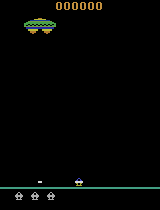

  7%|▋         | 678/10000 [00:25<05:55, 26.22it/s]


Current Learning Rate: [0.0019045084971874738]
Avg Train Loss: 0.016244835376739503
Total Reward: 273.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  4%|▍         | 448/10000 [00:31<11:15, 14.15it/s]


Current Learning Rate: [0.0017938926261462365]
Avg Train Loss: 0.014156681156158448
Total Reward: 189.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  8%|▊         | 790/10000 [00:47<09:18, 16.50it/s]


Current Learning Rate: [0.0016545084971874738]
Avg Train Loss: 0.022419405841827392
Total Reward: 273.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  7%|▋         | 654/10000 [00:42<10:05, 15.45it/s]


Current Learning Rate: [0.0015]
Avg Train Loss: 0.02382782337218523
Total Reward: 252.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  6%|▌         | 606/10000 [00:39<10:05, 15.52it/s]


Current Learning Rate: [0.0013454915028125263]
Avg Train Loss: 0.02226744928956032
Total Reward: 252.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▍         | 462/10000 [00:29<10:11, 15.59it/s]


Current Learning Rate: [0.0012061073738537636]
Avg Train Loss: 0.017547213515639305
Total Reward: 210.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  5%|▌         | 502/10000 [00:37<11:41, 13.53it/s]


Current Learning Rate: [0.0010954915028125263]
Avg Train Loss: 0.02048881769180298
Total Reward: 189.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  6%|▌         | 614/10000 [00:37<09:36, 16.29it/s]


Current Learning Rate: [0.0010244717418524233]
Avg Train Loss: 0.02280589485168457
Total Reward: 252.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  6%|▌         | 613/10000 [00:37<09:35, 16.31it/s]


Current Learning Rate: [0.002]
Avg Train Loss: 0.021385107281804084
Total Reward: 294.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


  6%|▌         | 613/10000 [00:35<09:05, 17.20it/s]


Current Learning Rate: [0.001975528258147577]
Avg Train Loss: 0.02138232512176037
Total Reward: 315.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


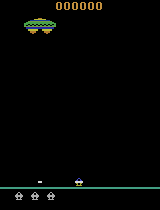

  8%|▊         | 765/10000 [00:44<08:52, 17.35it/s]


Current Learning Rate: [0.0019045084971874738]
Avg Train Loss: 0.028797444105148316
Total Reward: 315.0
Exploration Factor: epsilon: 0.9090909090909091
--------------------------------------------------


  6%|▋         | 640/10000 [00:40<09:45, 16.00it/s]


Current Learning Rate: [0.0017938926261462365]
Avg Train Loss: 0.025478955268859863
Total Reward: 189.0
Exploration Factor: epsilon: 0.8333333333333334
--------------------------------------------------


  8%|▊         | 767/10000 [00:47<09:29, 16.21it/s]


Current Learning Rate: [0.0016545084971874738]
Avg Train Loss: 0.027198904587328435
Total Reward: 210.0
Exploration Factor: epsilon: 0.7692307692307692
--------------------------------------------------


  8%|▊         | 846/10000 [00:52<09:22, 16.27it/s]


Current Learning Rate: [0.0015]
Avg Train Loss: 0.031964168643951414
Total Reward: 231.0
Exploration Factor: epsilon: 0.7142857142857143
--------------------------------------------------


  8%|▊         | 774/10000 [00:48<09:33, 16.07it/s]


Current Learning Rate: [0.0013454915028125263]
Avg Train Loss: 0.030018293523043395
Total Reward: 189.0
Exploration Factor: epsilon: 0.6666666666666666
--------------------------------------------------


  7%|▋         | 654/10000 [00:44<10:42, 14.54it/s]


Current Learning Rate: [0.0012061073738537636]
Avg Train Loss: 0.021126515520364045
Total Reward: 105.0
Exploration Factor: epsilon: 0.625
--------------------------------------------------


  8%|▊         | 822/10000 [00:59<11:04, 13.81it/s]


Current Learning Rate: [0.0010954915028125263]
Avg Train Loss: 0.026322797866165638
Total Reward: 168.0
Exploration Factor: epsilon: 0.5882352941176471
--------------------------------------------------


  9%|▉         | 941/10000 [01:09<11:06, 13.59it/s]


Current Learning Rate: [0.0010244717418524233]
Avg Train Loss: 0.02768520893678069
Total Reward: 168.0
Exploration Factor: epsilon: 0.5555555555555556
--------------------------------------------------


  8%|▊         | 806/10000 [00:58<11:12, 13.67it/s]


Current Learning Rate: [0.002]
Avg Train Loss: 0.02467649917677045
Total Reward: 189.0
Exploration Factor: epsilon: 0.5263157894736842
--------------------------------------------------


  8%|▊         | 832/10000 [01:03<11:34, 13.20it/s]


Current Learning Rate: [0.001975528258147577]
Avg Train Loss: 0.024591441563516857
Total Reward: 168.0
Exploration Factor: epsilon: 0.5
--------------------------------------------------


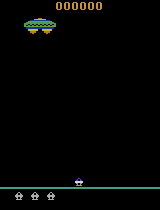

  9%|▉         | 878/10000 [01:06<11:35, 13.11it/s]


Current Learning Rate: [0.0019045084971874738]
Avg Train Loss: 0.026330294766277074
Total Reward: 189.0
Exploration Factor: epsilon: 0.47619047619047616
--------------------------------------------------


 10%|▉         | 974/10000 [01:15<11:41, 12.86it/s]


Current Learning Rate: [0.0017938926261462365]
Avg Train Loss: 0.02414641938060522
Total Reward: 252.0
Exploration Factor: epsilon: 0.45454545454545453
--------------------------------------------------


 12%|█▏        | 1184/10000 [01:40<12:29, 11.77it/s]


Current Learning Rate: [0.0016545084971874738]
Avg Train Loss: 0.03157544234842062
Total Reward: 189.0
Exploration Factor: epsilon: 0.4347826086956522
--------------------------------------------------


  9%|▊         | 864/10000 [01:14<13:10, 11.55it/s]


Current Learning Rate: [0.0015]
Avg Train Loss: 0.02343480885401368
Total Reward: 210.0
Exploration Factor: epsilon: 0.4166666666666667
--------------------------------------------------


 12%|█▏        | 1222/10000 [01:46<12:47, 11.44it/s]


Current Learning Rate: [0.0013454915028125263]
Avg Train Loss: 0.03208714357465506
Total Reward: 231.0
Exploration Factor: epsilon: 0.4
--------------------------------------------------


 10%|▉         | 992/10000 [01:30<13:41, 10.97it/s]


Current Learning Rate: [0.0012061073738537636]
Avg Train Loss: 0.024092647747322917
Total Reward: 168.0
Exploration Factor: epsilon: 0.3846153846153846
--------------------------------------------------


 12%|█▏        | 1152/10000 [01:51<14:19, 10.29it/s]


Current Learning Rate: [0.0010954915028125263]
Avg Train Loss: 0.03331894937232137
Total Reward: 210.0
Exploration Factor: epsilon: 0.37037037037037035
--------------------------------------------------


 15%|█▍        | 1454/10000 [02:26<14:20,  9.93it/s]


Current Learning Rate: [0.0010244717418524233]
Avg Train Loss: 0.040500259598344565
Total Reward: 210.0
Exploration Factor: epsilon: 0.35714285714285715
--------------------------------------------------


 14%|█▍        | 1390/10000 [02:14<13:51, 10.35it/s]


Current Learning Rate: [0.002]
Avg Train Loss: 0.03770079835951328
Total Reward: 252.0
Exploration Factor: epsilon: 0.3448275862068966
--------------------------------------------------


 16%|█▌        | 1574/10000 [02:43<14:37,  9.61it/s]


Current Learning Rate: [0.001975528258147577]
Avg Train Loss: 0.043150693359225986
Total Reward: 273.0
Exploration Factor: epsilon: 0.3333333333333333
--------------------------------------------------


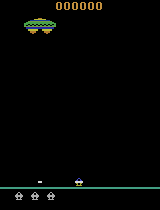

 10%|█         | 1014/10000 [01:54<16:53,  8.87it/s]


Current Learning Rate: [0.0019045084971874738]
Avg Train Loss: 0.030532160757482052
Total Reward: 168.0
Exploration Factor: epsilon: 0.3225806451612903
--------------------------------------------------


 18%|█▊        | 1761/10000 [03:09<14:44,  9.31it/s]


Current Learning Rate: [0.0017938926261462365]
Avg Train Loss: 0.05074564243145287
Total Reward: 420.0
Exploration Factor: epsilon: 0.3125
--------------------------------------------------


 12%|█▏        | 1152/10000 [02:20<18:00,  8.19it/s]


Current Learning Rate: [0.0016545084971874738]
Avg Train Loss: 0.035469587384536864
Total Reward: 147.0
Exploration Factor: epsilon: 0.30303030303030304
--------------------------------------------------


 24%|██▍       | 2382/10000 [04:37<14:46,  8.59it/s]


Current Learning Rate: [0.0015]
Avg Train Loss: 0.07082223070450128
Total Reward: 336.0
Exploration Factor: epsilon: 0.29411764705882354
--------------------------------------------------


 11%|█         | 1088/10000 [02:16<18:37,  7.98it/s]


Current Learning Rate: [0.0013454915028125263]
Avg Train Loss: 0.032042359756305816
Total Reward: 189.0
Exploration Factor: epsilon: 0.2857142857142857
--------------------------------------------------


 21%|██▏       | 2143/10000 [04:35<16:50,  7.78it/s]


Current Learning Rate: [0.0012061073738537636]
Avg Train Loss: 0.0644217080384493
Total Reward: 336.0
Exploration Factor: epsilon: 0.2777777777777778
--------------------------------------------------


 11%|█         | 1088/10000 [02:46<22:40,  6.55it/s]


Current Learning Rate: [0.0010954915028125263]
Avg Train Loss: 0.04104354583993554
Total Reward: 126.0
Exploration Factor: epsilon: 0.27027027027027023
--------------------------------------------------


 27%|██▋       | 2725/10000 [06:38<17:43,  6.84it/s]


Current Learning Rate: [0.0010244717418524233]
Avg Train Loss: 0.09268872369155287
Total Reward: 273.0
Exploration Factor: epsilon: 0.2631578947368421
--------------------------------------------------


 14%|█▍        | 1408/10000 [03:43<22:44,  6.30it/s]  

Current Learning Rate: [0.002]
Avg Train Loss: 0.051020096557959915
Total Reward: 189.0
Exploration Factor: epsilon: 0.25641025641025644
--------------------------------------------------


In [ ]:
# model params
eps_mem_size = 10
num_lstm_hidden_layers = 8
batch_size = 512
ep_window_size = 3
l_rate = 0.002
epsilon_decay = 0.8

epMem, model, agent = initialize_model(eps_mem_size, num_lstm_hidden_layers, batch_size, ep_window_size, l_rate, epsilon_decay)

# train params
SHOOTING_FACTOR=0.2
SHOOT_WINDOW=5
num_of_episodes = 40
time_step_size = 10000
window_size = 3
show_gifs = True
gif_show_frequency = 10
csvfile_name = 'case-4.csv'

perform_train_with_CosineAnnealingWarmRestarts(num_of_episodes, time_step_size, window_size, show_gifs, gif_show_frequency, csvfile_name)

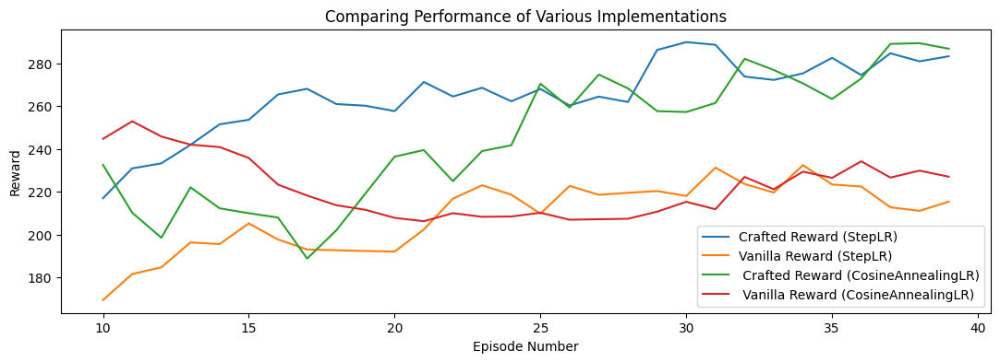

In [ ]:
import pandas as pd

NUMBER_OF_EPISODE_BOUND = 40
NUM_EPISODES_SKIP_START = 10
index_vector = range(NUM_EPISODES_SKIP_START, NUMBER_OF_EPISODE_BOUND)
plt.figure(figsize=(13,4))

def plot(df, c):
  df["evm_avg"] = df[0].ewm(span=30).mean()
  plt.plot(index_vector, df["evm_avg"][NUM_EPISODES_SKIP_START : NUMBER_OF_EPISODE_BOUND], label = c)

m = {"case-1":"Crafted Reward (StepLR)",
     "case-2":"Vanilla Reward (StepLR)",
     "case-3":" Crafted Reward (CosineAnnealingLR)",
     "case-4":" Vanilla Reward (CosineAnnealingLR)"}

for k in m.keys():
  c_df = pd.read_csv(f'./{k}.csv', header=None)
  plot(c_df, m[k])

plt.title("Comparing Performance of Various Implementations")
plt.xlabel("Episode Number")
plt.ylabel("Reward")
plt.legend()
plt.show()

# Using Deep Recurrent Q-Learning for Atari Bowling-v5 Game

In [ ]:
import torchvision.transforms as transforms

class Agent:
    def __init__(self, model, feature_extractor, epsMem, batchsize=64, ep_window_size=3, l_rate=0.001, epsilon_decay=0.9999):
        self.model = model
        self.feature_extractor = feature_extractor
        self.target_model = copy.deepcopy(model)
        self.deepMem = DeepMemory()
        self.epsMem = epsMem
        self.batchsize = batchsize
        self.ep_window_size = ep_window_size
        self.epsilon = 1.0
        self.gamma = 0.9
        self.optimizer = torch.optim.Adagrad(list(self.model.parameters()) + list(self.feature_extractor.parameters()), lr=l_rate)
        self.train_count = 0
        self.epsilon_decay = epsilon_decay

    def generate_windows(self, x, win):
        y = torch.zeros(x.shape[0], win, *x.shape[1:])

        y  = torch.stack([ x[i - win + 1 : i + 1]  for i in range(WINDOW_SIZE-1, x.shape[0]) ])
        return y


    def parse_state(self, state):

        normalize = transforms.Normalize(mean=[-0.445 / 0.225] * 3, std=[1 / 0.225] * 3)
        preprocess = transforms.Compose([
            transforms.ToPILImage(),
            transforms.ToTensor(),
            normalize
        ])

        torch_images = [preprocess(img) for img in state]
        torch_images = torch.stack(torch_images)
        return torch_images

    def make_states(self, raw_states):
        states = self.parse_state(raw_states)
        states = states.to(device)
        features = self.feature_extractor(states)

        result = self.generate_windows(features, WINDOW_SIZE)
        return result

    def predict(self, state):
        state = self.make_states(state)
        pred = self.model(state)
        if random.random() < self.epsilon:
            return random.randint(0, 5) # changed this to 6 for Bowling from Assault-v5
        else:
            return torch.argmax(pred[0]).item()

    def train(self):
        eps_batch = self.epsMem.sample(self.ep_window_size)
        loss_acc = 0.0
        for i in range(0, len(eps_batch), self.batchsize):
            raw_batch = eps_batch[(max(i-WINDOW_SIZE+1,0)):(i+self.batchsize)]
            states = [x[0] for x in raw_batch]
            next_states = [x[1] for x in raw_batch]
            if i == 0:
                null_paddings = [np.zeros(SIZE, dtype=np.uint8) for i in range(WINDOW_SIZE-1)]
                states = null_paddings + states
                next_states = null_paddings[:-1] + [states[0]] + next_states
            else:
                start_batch = eps_batch[(i-WINDOW_SIZE+1):i]
                states_padding = [x[0] for x in start_batch]
                next_states_padding = [x[1] for x in start_batch]
                states = states_padding + states
                next_states = next_states_padding + next_states

            actions = [int(x[2]) for x in raw_batch]
            rewards = [float(x[3]) for x in raw_batch]
            dones = [float(int(x[4])) for x in raw_batch]

            loss_acc += self.train_batch(states, next_states, actions, rewards, dones)
        return loss_acc


    def train_batch(self, states, next_states, actions, rewards, dones):
        self.feature_extractor.train()
        self.feature_extractor.zero_grad()
        states = self.make_states(states)
        next_states = self.make_states(next_states)
        future_reward = torch.max(self.target_model(next_states), 1)[0]
        dones = torch.Tensor(dones).to(device)
        rewards = torch.Tensor(rewards).to(device)
        actions = torch.Tensor(actions).long().to(device)

        final_reward = (rewards + future_reward * (1.0 - dones) * self.gamma).detach()
        self.model.train()
        self.model.zero_grad()
        predicted_reward = self.model(states)
        actions_one_hot = torch.nn.functional.one_hot(actions, 6) # changed this to 6 for Bowling from Assault-v5
        predicted_reward = torch.sum(predicted_reward * actions_one_hot, axis=1)

        loss = torch.nn.functional.mse_loss(predicted_reward, final_reward)
        loss.backward()
        self.optimizer.step()

        self.train_count += 1

        if self.train_count % 10 == 0:
            self.target_model = copy.deepcopy(self.model)

        return loss.item()

In [ ]:
import torchvision.models as models

class LSTM(nn.Module):
    def __init__(self, inp, hidden, layers):
        super().__init__()
        self.hidden = hidden #defining no. of hidden Layers
        self.layers = layers #Defining no. of layers in an LSTM
        self.lstm = nn.LSTM(inp, hidden, layers,batch_first=True) #giving arguments as input to the LSTM
        self.fc = nn.Linear(hidden, 6) # Changing thhis to 6 for Bowling from Assault-v5

    def forward(self, x):
        self.lstm.flatten_parameters()
        batch_size = x.size(0)
        h0 = torch.zeros(self.layers, batch_size, self.hidden).to(device) #Initializing
        c0 = torch.zeros(self.layers, batch_size, self.hidden).to(device) #Initializing
        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :]) #Taking the final time_step of the time sequence
        return out


class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.resnet= models.resnet18(pretrained=True)
        self.resnet = nn.Sequential(*list(self.resnet.children())[:-1])
        for params in self.resnet.parameters():
            params.requires_grad = False
        self.resnet.eval()

    def forward(self,x):
        return self.resnet(x).view(-1,512)

In [ ]:
class EpisodicMemory:

    def __init__(self, MAX_LENGTH=5000):
        self.memory = []
        self.episode_memory = []
        self.MAX_LENGTH = MAX_LENGTH

    def start_episode(self):
        self.episode_memory = []

    def end_episode(self):

        # Here we comment out the incentivization to use the original vanilla reward function
        '''
        # last_time_shot=0
        # for i in range(len(self.episode_memory)):
        #     if self.episode_memory[i][2] in [1]:
        #         last_time_shot=i
        #     penalty=1/(np.exp((i-last_time_shot)/SHOOT_WINDOW)+1)
        #     self.episode_memory[i][3] += (len(self.episode_memory) - i)/10000 + penalty*SHOOTING_FACTOR
        '''

        self.memory.append(self.episode_memory.copy())
        if len(self.memory) > self.MAX_LENGTH:
            self.memory.pop(0)

    def remember(self, state, next_state, action, reward, done):
        self.episode_memory.append([state, next_state, action, reward, done])

    def sample(self, episode_size):
        batch = []
        if(len(self.memory) == 0):
            return batch
        for _ in range(episode_size):
            index = np.random.randint(0, len(self.memory))
            batch = batch + self.memory[index]
        return batch

In [ ]:
from tqdm import tqdm
from IPython.display import Image

env = gym.make("ALE/Bowling-v5", render_mode="rgb_array")
epsilon_decay=0.95

def initialize_model(eps_mem_size, num_lstm_hidden_layers, batch_size, ep_window_size, l_rate, epsilon_decay):
  epMem = EpisodicMemory(MAX_LENGTH=eps_mem_size)
  feature_extractor = Net().to(device)
  model = LSTM(512, num_lstm_hidden_layers, 1).to(device)
  agent = Agent(model, feature_extractor, epMem, batch_size, ep_window_size, l_rate, epsilon_decay)
  return (epMem, model, agent)


def perform_train(num_of_episodes, time_step_size, window_size, show_gifs=False, gif_show_frequency=1, csvfile_name='plot_data.csv'):
  with open(csvfile_name, 'w') as file:
      pass
  for i in range(num_of_episodes):
      if(i < 100):
            agent.epsilon=1/max(1, np.sqrt(i)) # changed this to np.sqrt(i) from i for Bowling from Assault-v5
      else:
           agent.epsilon = 0.1*(epsilon_decay**(i-99))

      observation, info = env.reset()
      frames = []
      obs, rew = [], []
      curr_state = [np.zeros(SIZE, dtype=np.uint8) for i in range(window_size)]
      total_reward = 0
      epMem.start_episode()
      avg_train_loss = 0
      last_life = time_step_size

      for t in tqdm(range(time_step_size)):
          frames.append(env.render())
          action = agent.predict(curr_state)
          observation, reward, terminated, truncated, info = env.step(action)
          prev_state = curr_state.copy()
          curr_state.pop(0)
          curr_state.append(observation.copy())
          obs.append(observation.copy())
          rew.append(reward)
          total_reward += reward
          done = terminated or truncated
          epMem.remember(prev_state[-1].copy(), curr_state[-1].copy(), action, reward, done)
          if(t % 100 == 0):
            avg_train_loss += agent.train()
          if done:
              last_life = t
              break

      epMem.end_episode()
      print("Avg Train Loss:", avg_train_loss/time_step_size)
      print("Total Reward:", total_reward)
      print("Exploration Factor: epsilon:",agent.epsilon)
      print("--------------------------------------------------")
      with open(csvfile_name, 'a') as file:
            x = [total_reward, avg_train_loss/time_step_size, agent.epsilon, last_life]
            x = [str(i) for i in x]
            file.write(','.join(x) + '\n')

      if(show_gifs and i % gif_show_frequency == 0):
          save_frames_as_gif(frames, filename=f'gym_animation_{i//gif_show_frequency}.gif')
          display(Image(data=open(f'gym_animation_{i//gif_show_frequency}.gif','rb').read(), format='png'))

In [ ]:
# model params
eps_mem_size = 10
num_lstm_hidden_layers = 8
batch_size = 512
ep_window_size = 3
l_rate = 0.005
epsilon_decay = 0.9

epMem, model, agent = initialize_model(eps_mem_size, num_lstm_hidden_layers, batch_size, ep_window_size, l_rate, epsilon_decay)

 21%|██        | 2124/10000 [00:11<00:44, 177.30it/s]


Avg Train Loss: 0.0
Total Reward: 31.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


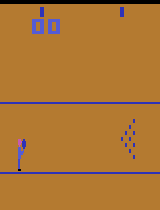

 21%|██        | 2097/10000 [03:51<14:32,  9.05it/s]


Avg Train Loss: 0.0016088706774637102
Total Reward: 22.0
Exploration Factor: epsilon: 1.0
--------------------------------------------------


 22%|██▏       | 2164/10000 [04:14<15:22,  8.50it/s]


Avg Train Loss: 0.0012618463596794755
Total Reward: 21.0
Exploration Factor: epsilon: 0.7071067811865475
--------------------------------------------------


 22%|██▏       | 2176/10000 [04:21<15:38,  8.33it/s]


Avg Train Loss: 0.0012318058532779104
Total Reward: 13.0
Exploration Factor: epsilon: 0.5773502691896258
--------------------------------------------------


 22%|██▏       | 2172/10000 [04:04<14:42,  8.87it/s]


Avg Train Loss: 0.0009083332855836488
Total Reward: 17.0
Exploration Factor: epsilon: 0.5
--------------------------------------------------


 22%|██▏       | 2164/10000 [04:11<15:09,  8.62it/s]


Avg Train Loss: 0.0008963160280138254
Total Reward: 36.0
Exploration Factor: epsilon: 0.4472135954999579
--------------------------------------------------


 22%|██▏       | 2152/10000 [04:04<14:52,  8.80it/s]


Avg Train Loss: 0.0009764893307583406
Total Reward: 28.0
Exploration Factor: epsilon: 0.4082482904638631
--------------------------------------------------


 22%|██▏       | 2159/10000 [04:13<15:19,  8.53it/s]


Avg Train Loss: 0.000969698469445575
Total Reward: 29.0
Exploration Factor: epsilon: 0.3779644730092272
--------------------------------------------------


 21%|██▏       | 2149/10000 [04:07<15:05,  8.67it/s]


Avg Train Loss: 0.0009748136573412921
Total Reward: 49.0
Exploration Factor: epsilon: 0.35355339059327373
--------------------------------------------------


 21%|██        | 2072/10000 [04:03<15:32,  8.50it/s]


Avg Train Loss: 0.0014130476216669195
Total Reward: 59.0
Exploration Factor: epsilon: 0.3333333333333333
--------------------------------------------------


 21%|██▏       | 2136/10000 [04:04<14:58,  8.75it/s]


Avg Train Loss: 0.002256916206306778
Total Reward: 31.0
Exploration Factor: epsilon: 0.31622776601683794
--------------------------------------------------


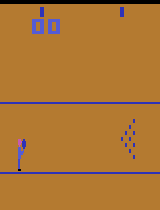

 22%|██▏       | 2152/10000 [04:08<15:07,  8.65it/s]


Avg Train Loss: 0.0024624039548332803
Total Reward: 28.0
Exploration Factor: epsilon: 0.30151134457776363
--------------------------------------------------


 21%|██        | 2123/10000 [04:08<15:21,  8.55it/s]


Avg Train Loss: 0.002790130840614438
Total Reward: 30.0
Exploration Factor: epsilon: 0.2886751345948129
--------------------------------------------------


 21%|██        | 2116/10000 [04:10<15:33,  8.45it/s]


Avg Train Loss: 0.0016779657120117918
Total Reward: 26.0
Exploration Factor: epsilon: 0.2773500981126146
--------------------------------------------------


 21%|██▏       | 2132/10000 [04:08<15:18,  8.56it/s]


Avg Train Loss: 0.0022274871767498554
Total Reward: 41.0
Exploration Factor: epsilon: 0.2672612419124244
--------------------------------------------------


 21%|██        | 2081/10000 [03:57<15:05,  8.75it/s]


Avg Train Loss: 0.0029084869250655173
Total Reward: 12.0
Exploration Factor: epsilon: 0.2581988897471611
--------------------------------------------------


 21%|██        | 2096/10000 [03:53<14:41,  8.97it/s]


Avg Train Loss: 0.0017971096771303564
Total Reward: 18.0
Exploration Factor: epsilon: 0.25
--------------------------------------------------


 21%|██        | 2105/10000 [04:03<15:12,  8.65it/s]


Avg Train Loss: 0.0023252667835215106
Total Reward: 34.0
Exploration Factor: epsilon: 0.24253562503633297
--------------------------------------------------


 21%|██        | 2057/10000 [03:59<15:24,  8.59it/s]


Avg Train Loss: 0.002397927036229521
Total Reward: 6.0
Exploration Factor: epsilon: 0.23570226039551587
--------------------------------------------------


 21%|██        | 2104/10000 [04:11<15:42,  8.37it/s]


Avg Train Loss: 0.002214251396153122
Total Reward: 15.0
Exploration Factor: epsilon: 0.22941573387056174
--------------------------------------------------


 21%|██        | 2116/10000 [04:12<15:40,  8.39it/s]


Avg Train Loss: 0.0012511801782762633
Total Reward: 14.0
Exploration Factor: epsilon: 0.22360679774997896
--------------------------------------------------


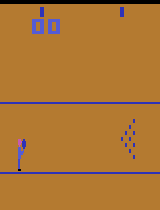

 22%|██▏       | 2192/10000 [04:08<14:46,  8.81it/s]


Avg Train Loss: 0.001129195157880895
Total Reward: 20.0
Exploration Factor: epsilon: 0.2182178902359924
--------------------------------------------------


 21%|██▏       | 2145/10000 [04:06<15:02,  8.71it/s]


Avg Train Loss: 0.0012026734965620563
Total Reward: 22.0
Exploration Factor: epsilon: 0.21320071635561041
--------------------------------------------------


 21%|██        | 2093/10000 [03:57<14:55,  8.83it/s]


Avg Train Loss: 0.00124212156716967
Total Reward: 12.0
Exploration Factor: epsilon: 0.20851441405707477
--------------------------------------------------


 22%|██▏       | 2161/10000 [04:05<14:51,  8.79it/s]


Avg Train Loss: 0.0010589404117665254
Total Reward: 24.0
Exploration Factor: epsilon: 0.20412414523193154
--------------------------------------------------


 22%|██▏       | 2240/10000 [04:17<14:50,  8.71it/s]


Avg Train Loss: 0.0009438821338000707
Total Reward: 23.0
Exploration Factor: epsilon: 0.2
--------------------------------------------------


 22%|██▏       | 2217/10000 [04:18<15:07,  8.58it/s]


Avg Train Loss: 0.0009912489694077521
Total Reward: 30.0
Exploration Factor: epsilon: 0.19611613513818404
--------------------------------------------------


 22%|██▏       | 2163/10000 [04:10<15:07,  8.64it/s]


Avg Train Loss: 0.0008206663443241269
Total Reward: 31.0
Exploration Factor: epsilon: 0.19245008972987526
--------------------------------------------------


 21%|██▏       | 2143/10000 [04:10<15:18,  8.55it/s]


Avg Train Loss: 0.0007811846732744016
Total Reward: 53.0
Exploration Factor: epsilon: 0.1889822365046136
--------------------------------------------------


 21%|██        | 2081/10000 [04:00<15:14,  8.66it/s]


Avg Train Loss: 0.0011421918805339373
Total Reward: 20.0
Exploration Factor: epsilon: 0.18569533817705186
--------------------------------------------------


 21%|██        | 2117/10000 [04:09<15:28,  8.49it/s]


Avg Train Loss: 0.0014622350985533557
Total Reward: 6.0
Exploration Factor: epsilon: 0.18257418583505536
--------------------------------------------------


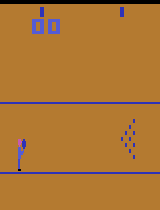

 21%|██        | 2108/10000 [04:10<15:38,  8.41it/s]


Avg Train Loss: 0.0011487653020070866
Total Reward: 15.0
Exploration Factor: epsilon: 0.1796053020267749
--------------------------------------------------


 21%|██▏       | 2132/10000 [04:09<15:20,  8.55it/s]


Avg Train Loss: 0.0011086426714784466
Total Reward: 25.0
Exploration Factor: epsilon: 0.17677669529663687
--------------------------------------------------


 21%|██▏       | 2131/10000 [04:09<15:21,  8.54it/s]


Avg Train Loss: 0.001175072220340371
Total Reward: 42.0
Exploration Factor: epsilon: 0.17407765595569785
--------------------------------------------------


 20%|██        | 2041/10000 [03:58<15:30,  8.55it/s]


Avg Train Loss: 0.001388362617220264
Total Reward: 15.0
Exploration Factor: epsilon: 0.17149858514250882
--------------------------------------------------


 20%|██        | 2029/10000 [03:56<15:29,  8.57it/s]


Avg Train Loss: 0.0012538767647813074
Total Reward: 6.0
Exploration Factor: epsilon: 0.1690308509457033
--------------------------------------------------


 20%|██        | 2013/10000 [03:54<15:29,  8.59it/s]


Avg Train Loss: 0.0012637982416315936
Total Reward: 0.0
Exploration Factor: epsilon: 0.16666666666666666
--------------------------------------------------


 22%|██▏       | 2164/10000 [04:02<14:37,  8.93it/s]


Avg Train Loss: 0.0010614821675699205
Total Reward: 18.0
Exploration Factor: epsilon: 0.1643989873053573
--------------------------------------------------


 22%|██▏       | 2168/10000 [04:06<14:51,  8.78it/s]


Avg Train Loss: 0.0012231170519313309
Total Reward: 16.0
Exploration Factor: epsilon: 0.16222142113076254
--------------------------------------------------


 22%|██▏       | 2176/10000 [04:04<14:38,  8.90it/s]


Avg Train Loss: 0.0007512983743275982
Total Reward: 20.0
Exploration Factor: epsilon: 0.16012815380508713
--------------------------------------------------


 21%|██▏       | 2140/10000 [04:05<15:00,  8.73it/s]


Avg Train Loss: 0.0007460354098817334
Total Reward: 24.0
Exploration Factor: epsilon: 0.15811388300841897
--------------------------------------------------


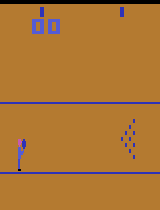

In [ ]:
# train params
SHOOTING_FACTOR=0.2
SHOOT_WINDOW=5
num_of_episodes = 200
time_step_size = 10000
window_size = 3
show_gifs = True
gif_show_frequency = 10
csvfile_name = 'bowling.csv'

perform_train(num_of_episodes, time_step_size, window_size, show_gifs, gif_show_frequency, csvfile_name)

In [ ]:
import pandas as pd
bf = pd.read_csv('./bowling.csv', header=None)

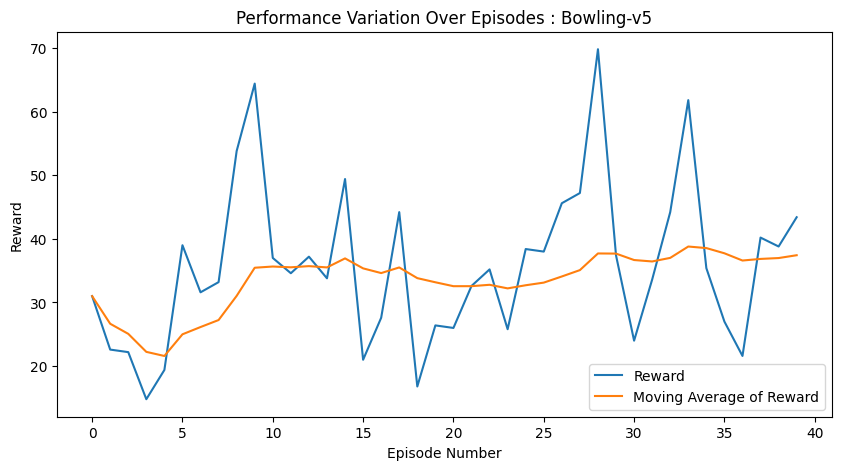

In [ ]:
plt.figure(figsize=(10,5))
NUMBER_OF_EPISODE_BOUND = 40
WINDOW_FOR_MOVING_AVG = 2
index_vector = range(NUMBER_OF_EPISODE_BOUND)

bf["evm_avg"] = bf[0].ewm(span=30).mean() # calculate the exponentially weighted moving average
plt.title("Performance Variation Over Episodes : Bowling-v5")
plt.plot(index_vector, bf[0][:NUMBER_OF_EPISODE_BOUND], label="Reward")
plt.plot(index_vector, bf["evm_avg"][:NUMBER_OF_EPISODE_BOUND], label="Moving Average of Reward")
plt.xlabel("Episode Number")
plt.ylabel("Reward")
plt.legend()
plt.show()

### We can see that the model is learning to improve its gameplay, but since the training has happened only for a small number of episodes, we can say that our agent is still learning to play the game. We should expect the game to improve as the number of episodes for it trains increases